# Gesture Recognition
In this group case study, for given 5 gestures recognition, following two types of models are required to be built up:

1) A 3D Conv model and

2) An stack of 2D CNN and RNN.

In [1]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Following libraries have been used in this project
import numpy as np
import os
from scipy.misc import imread, imresize
import datetime
import keras
import glob
import cv2
!pip install scikit-image
import skimage
from skimage import io
import random
import matplotlib.pyplot as plt
%matplotlib inline

from keras.models import Sequential, Model
from keras.layers import Dense, GRU, Flatten, TimeDistributed, Flatten, BatchNormalization, Activation,Dropout
from keras.layers.recurrent import LSTM
from keras.layers.convolutional import Conv2D, MaxPooling2D, Conv3D, MaxPooling3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau,EarlyStopping
from keras.regularizers import l2
from keras import optimizers
from keras.losses import categorical_crossentropy
from sklearn.metrics import roc_auc_score
from keras.callbacks import *



#We set the random seed so that the results don't vary drastically.
np.random.seed(30)
import random as rn
rn.seed(30)
from keras import backend as K
import tensorflow as tf
tf.set_random_seed(30)

Using TensorFlow backend.


You should consider upgrading via the '/mnt/disks/user/anaconda3/bin/python -m pip install --upgrade pip' command.


In [3]:
# loading data
train_doc = np.random.permutation(open('/mnt/disks/user/project/PROJECT/Project_data/train.csv').readlines())
val_doc = np.random.permutation(open('/mnt/disks/user/project/PROJECT/Project_data/val.csv').readlines())
train_path = '/mnt/disks/user/project/PROJECT/Project_data/train'
val_path = '/mnt/disks/user/project/PROJECT/Project_data/val'

In [4]:
# initializing important parameters
classes = 5
height = 120
width = 120
channels = 3
total_frames = 30 
frames_to_pick = 30

In [5]:
# function for plotting images
def plot_image(images, captions=None, cmap=None ):
    f, axes = plt.subplots(1, len(images), sharey=True)
    f.set_figwidth(15)
    for ax,image in zip(axes, images):
        ax.imshow(image, cmap)

In [6]:
# function for image reshape, this is used for cropping as well as for resizing
def image_reshape(image):
    if image.shape[0] >= 120 and image.shape[1] > 120 :
        if image.shape[0] != image.shape[1]:
            image=image[0:120,20:140]
        else:
            image = imresize(image, (height,width, channels))
    return image

In [7]:
# function to normalise the data. Three types of normalising can be done.
def normalize(batch_data, image, folder, idx, norm_type="norm_1"):
    if norm_type is "norm_1":
        batch_data[folder,idx,:,:,0] = image[:,:,0]/image.max()
        batch_data[folder,idx,:,:,1] = image[:,:,1]/image.max()
        batch_data[folder,idx,:,:,2] = image[:,:,2]/image.max()
    elif norm_type is "norm_2":
        batch_data[folder,idx,:,:,0] = image[:,:,0] - np.min(image[:,:,0])/(np.max(image[:,:,0]) - np.min(image[:,:,0]))
        batch_data[folder,idx,:,:,1] = image[:,:,1] - np.min(image[:,:,1])/(np.max(image[:,:,1]) - np.min(image[:,:,1]))
        batch_data[folder,idx,:,:,2] = image[:,:,2] - np.min(image[:,:,2])/(np.max(image[:,:,2]) - np.min(image[:,:,2]))
    else :
        batch_data[folder,idx,:,:,0] = image[:,:,0] - np.percentile(image[:,:,0],5)/(np.percentile(image[:,:,0],95) - np.percentile(image[:,:,0],5))
        batch_data[folder,idx,:,:,1] = image[:,:,1] - np.percentile(image[:,:,1],5)/(np.percentile(image[:,:,1],95) - np.percentile(image[:,:,1],5))
        batch_data[folder,idx,:,:,2] = image[:,:,2] - np.percentile(image[:,:,2],5)/(np.percentile(image[:,:,2],95) - np.percentile(image[:,:,2],5))
    
    return batch_data

###  Plotting the original image and the RGB channels

In [8]:
size = np.random.permutation(train_doc)
idx = np.round(np.linspace(0,29,10)).astype(int)

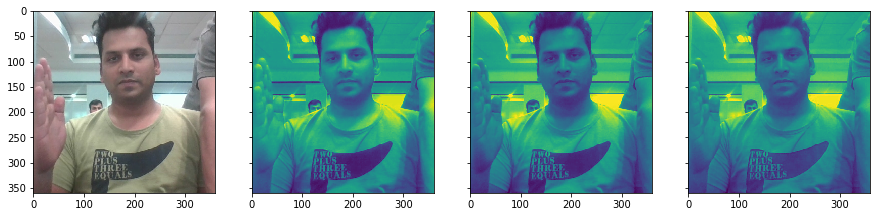

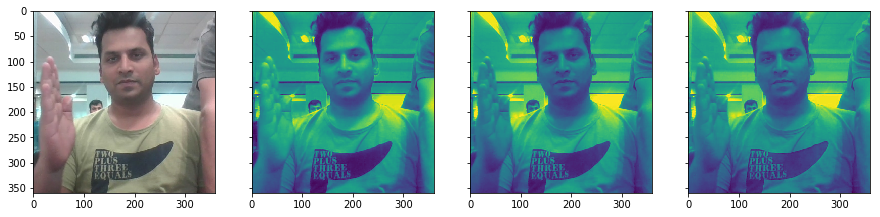

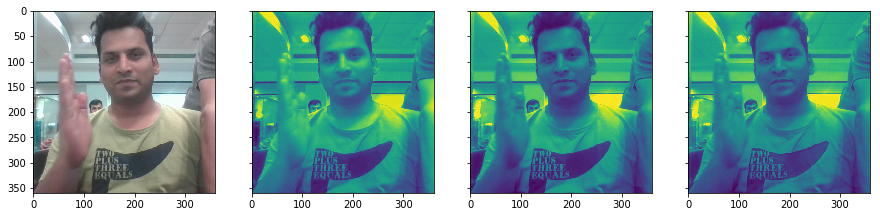

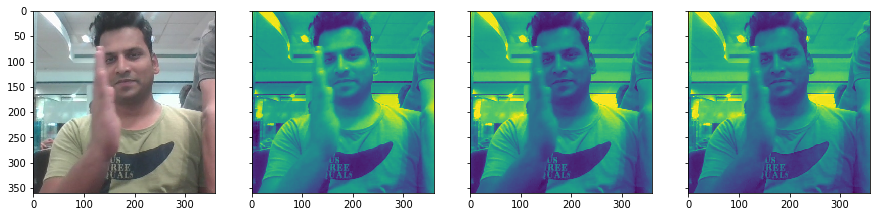

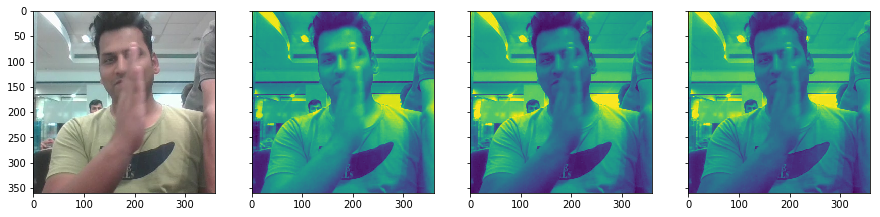

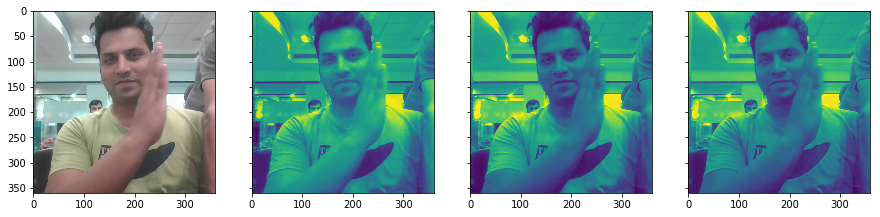

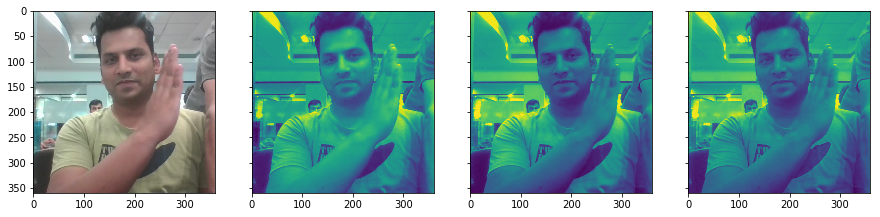

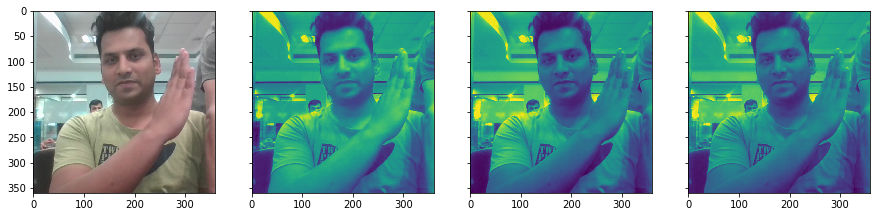

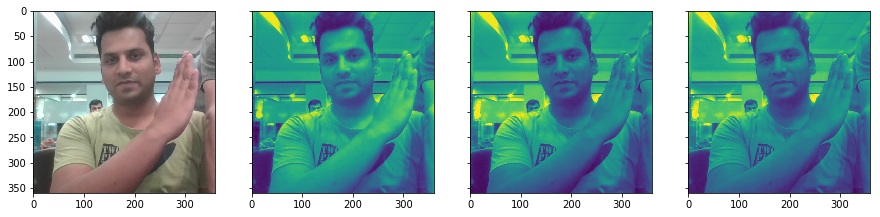

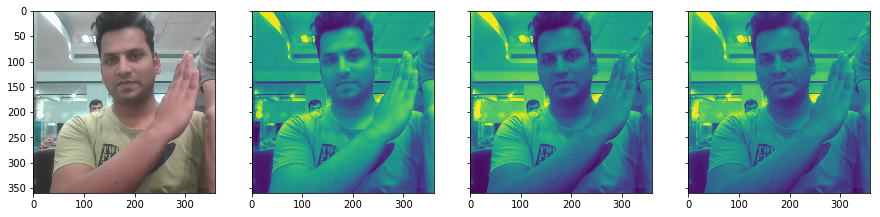

In [9]:
rand_index = random.randint(0, len(train_doc))
size[rand_index].strip().split(';')
imgs = sorted(os.listdir(train_path+'/'+ size[rand_index].split(';')[0]))

for index, item in enumerate(idx):
    #image = io.imread(train_path+'/'+ t[rand_index].strip().split(';')[0]+'/'+item, cv2.IMREAD_COLOR)    
    image = cv2.imread(train_path+'/'+ size[rand_index].strip().split(';')[0]+'/'+imgs[item], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharey=True)
    f.set_figwidth(15)
    ax1.imshow(image)

    # RGB channels
    ax2.imshow(image[:, : , 0])
    ax3.imshow(image[:, : , 1])
    ax4.imshow(image[:, : , 2])    

### Thresholding

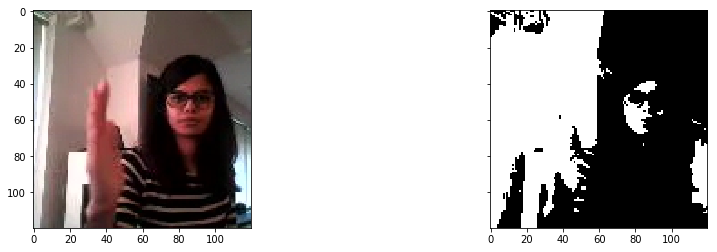

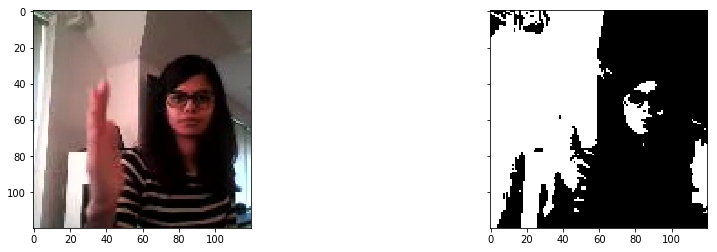

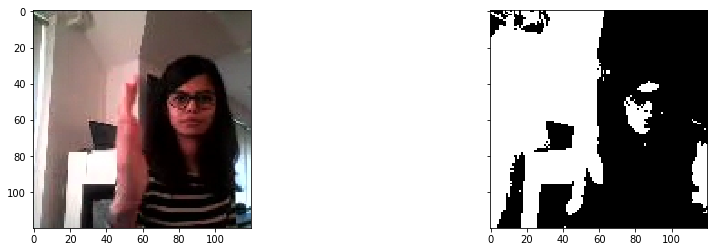

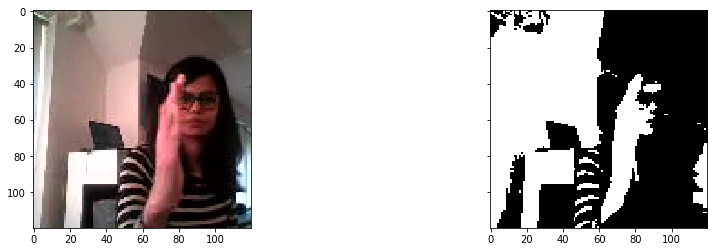

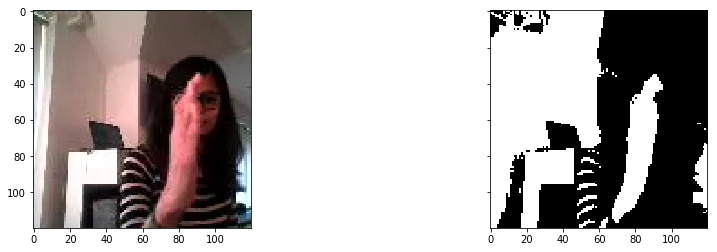

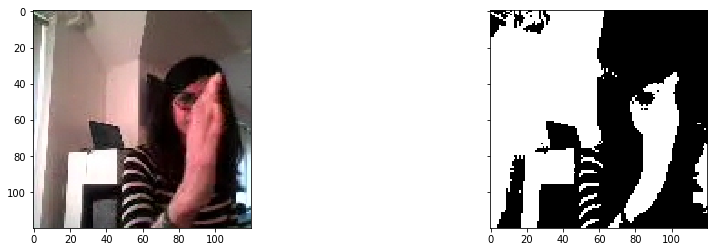

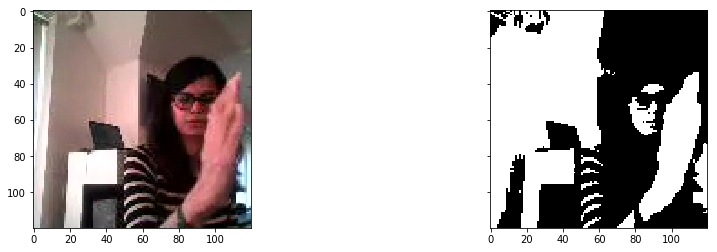

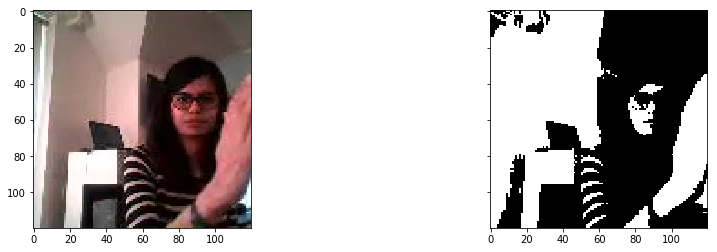

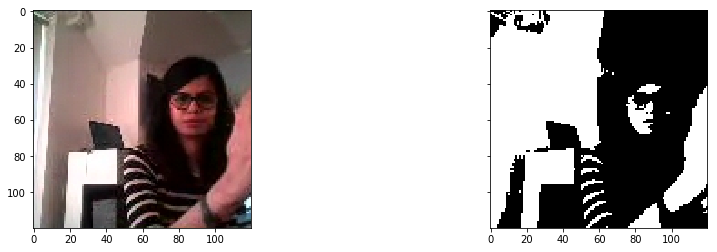

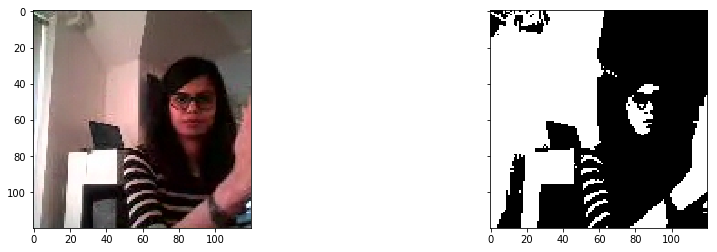

In [10]:
rand_index = random.randint(0, len(train_doc))
size[rand_index].strip().split(';')
imgs = sorted(os.listdir(train_path+'/'+ size[rand_index].split(';')[0]))

for index, item in enumerate(idx):
    #image = io.imread(train_path+'/'+ t[rand_index].strip().split(';')[0]+'/'+item, cv2.IMREAD_COLOR)    
    image = cv2.imread(train_path+'/'+ size[rand_index].strip().split(';')[0]+'/'+imgs[item], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    resized_image = image_reshape(image)
    resized_bin_image = resized_image[:, :, 0] > 125
    plot_image([resized_image,resized_bin_image], cmap='gray')   

### Augmentations

There are multiple types of augmentations possible. The basic ones transform the original image using one of the following types of transformations:

1. Linear transformations
2. Affine transformations

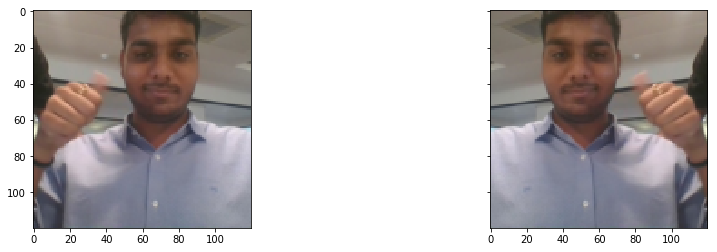

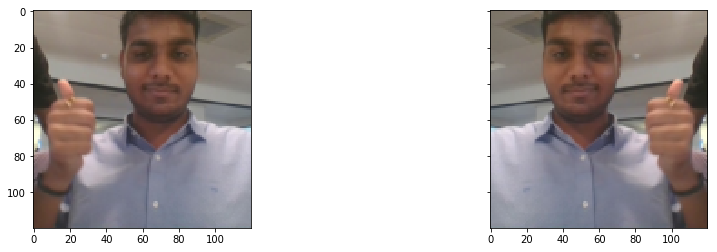

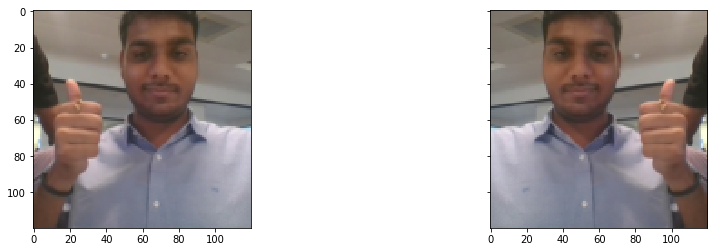

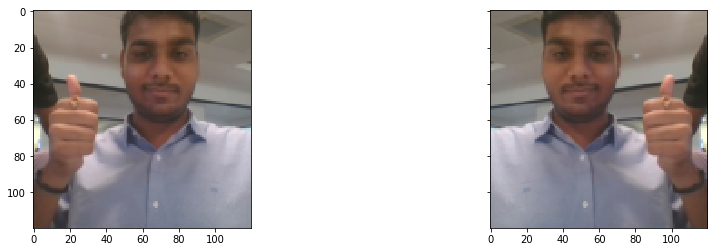

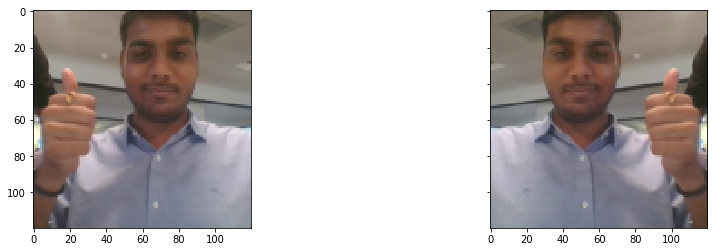

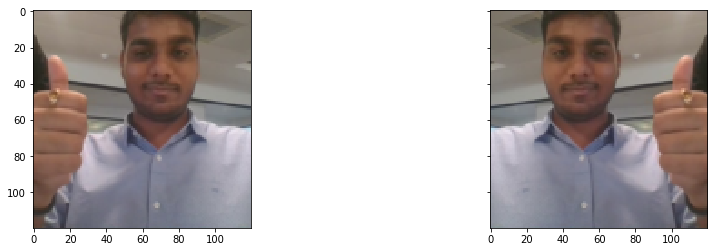

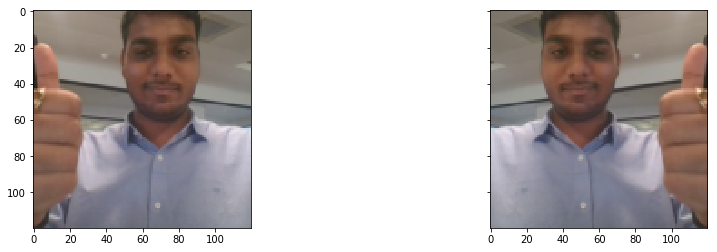

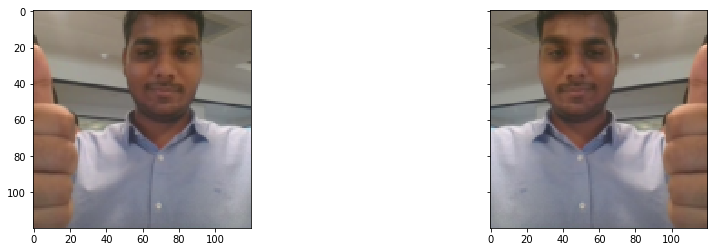

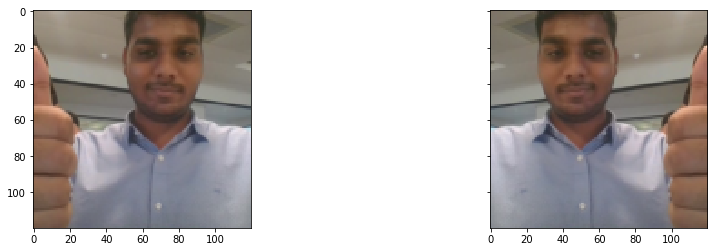

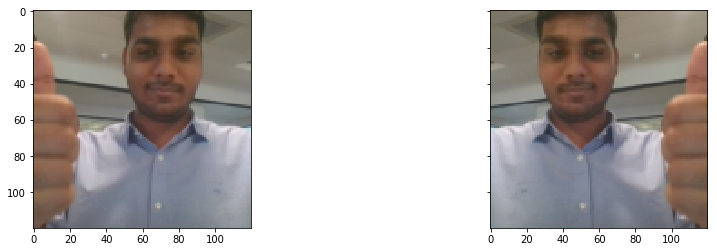

In [11]:
from skimage import transform as tf
rand_index = random.randint(0, len(train_doc))
size[rand_index].strip().split(';')
imgs = sorted(os.listdir(train_path+'/'+ size[rand_index].split(';')[0]))

for index, item in enumerate(idx):
    #image = io.imread(train_path+'/'+ t[rand_index].strip().split(';')[0]+'/'+item, cv2.IMREAD_COLOR)    
    image = cv2.imread(train_path+'/'+ size[rand_index].strip().split(';')[0]+'/'+imgs[item], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    resized_image = image_reshape(image)
    # flip left-right
    image_flipr = np.fliplr(resized_image)

    plot_image([resized_image,image_flipr])   


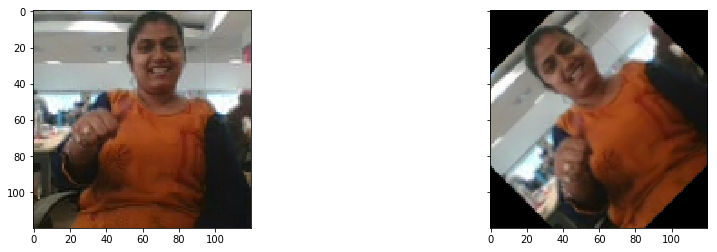

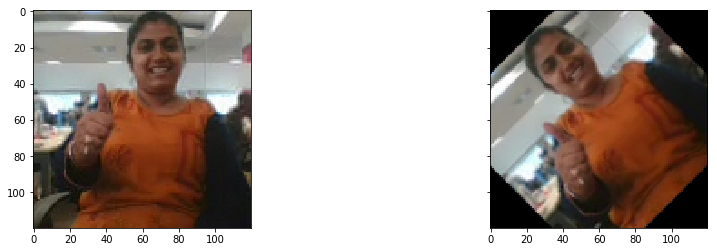

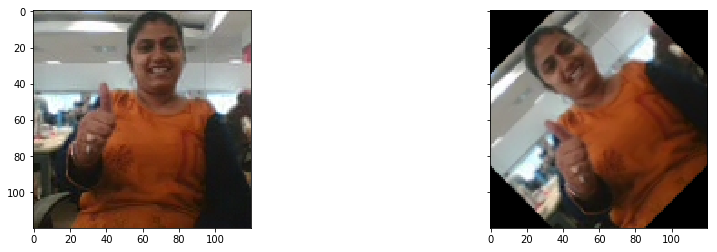

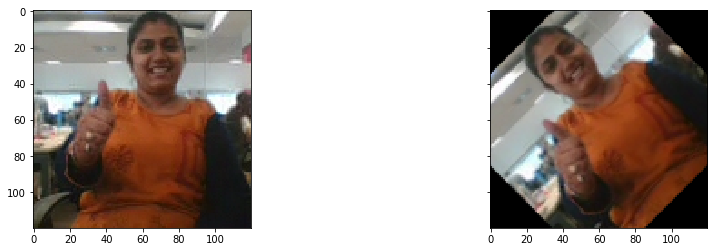

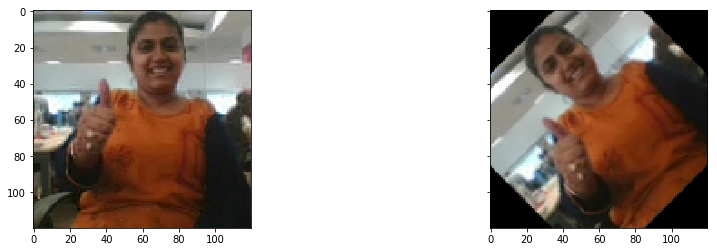

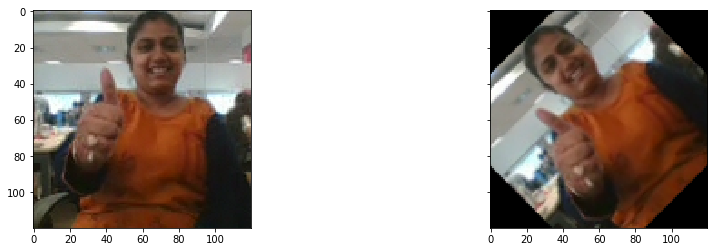

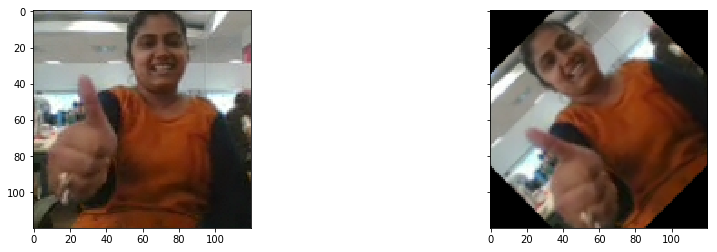

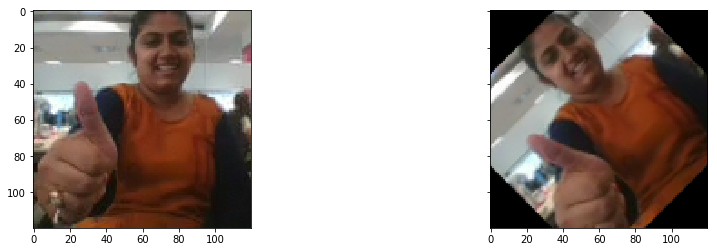

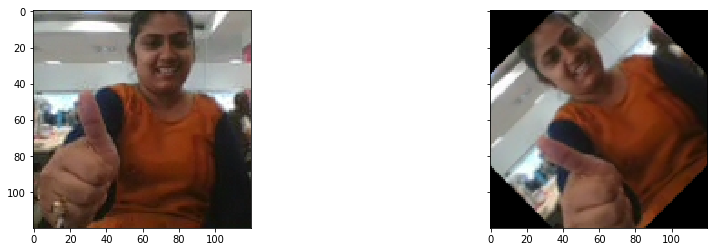

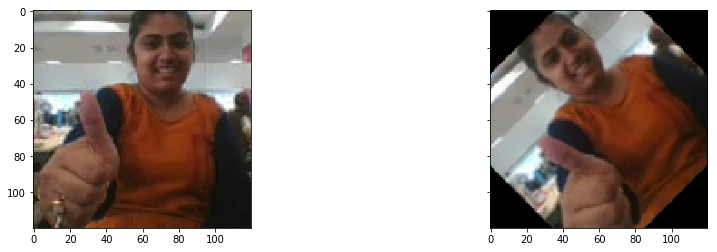

In [12]:
rand_index = random.randint(0, len(train_doc))
size[rand_index].strip().split(';')
imgs = sorted(os.listdir(train_path+'/'+ size[rand_index].split(';')[0]))

for index, item in enumerate(idx):
   
    image = cv2.imread(train_path+'/'+ size[rand_index].strip().split(';')[0]+'/'+imgs[item], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    resized_image = image_reshape(image)
    
    # specify x and y coordinates to be used for shifting (mid points)
    shift_x, shift_y = resized_image.shape[0]/2, resized_image.shape[1]/2

    # translation by certain units
    matrix_to_topleft = tf.SimilarityTransform(translation=[-shift_x, -shift_y])
    matrix_to_center = tf.SimilarityTransform(translation=[shift_x, shift_y])

    # rotation
    rot_transforms =  tf.AffineTransform(rotation=np.deg2rad(45))
    rot_matrix = matrix_to_topleft + rot_transforms + matrix_to_center
    rot_image = tf.warp(resized_image, rot_matrix)


    plot_image([resized_image, rot_image])

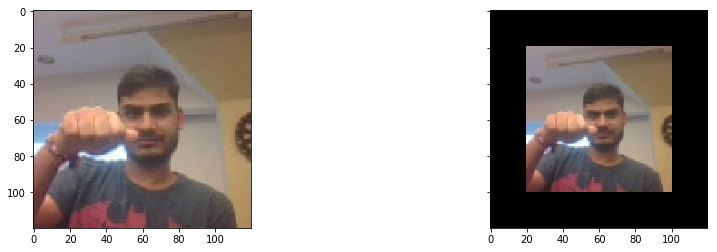

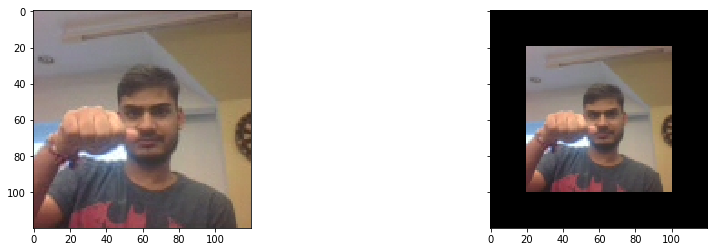

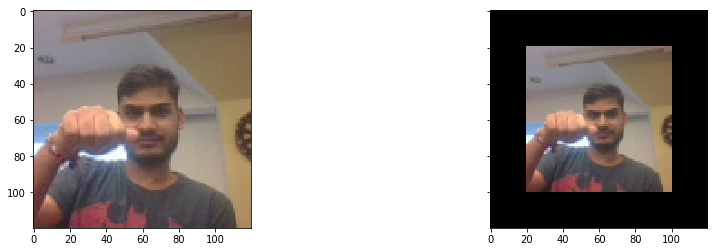

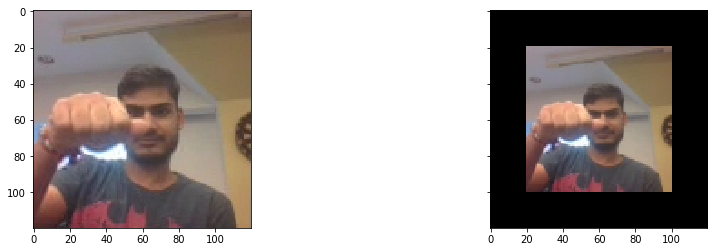

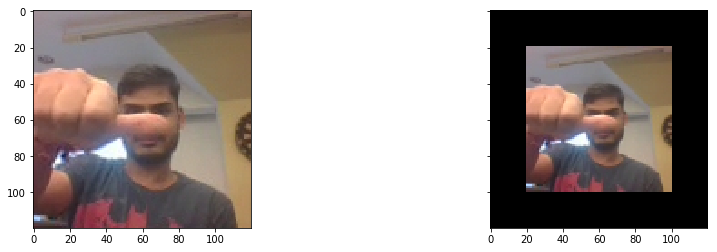

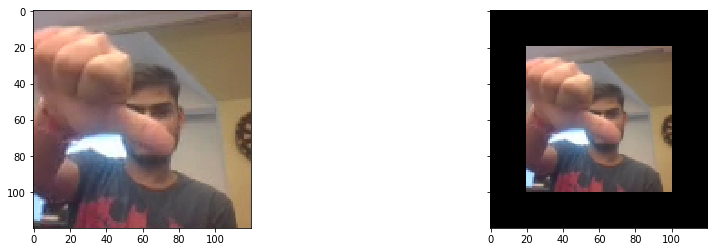

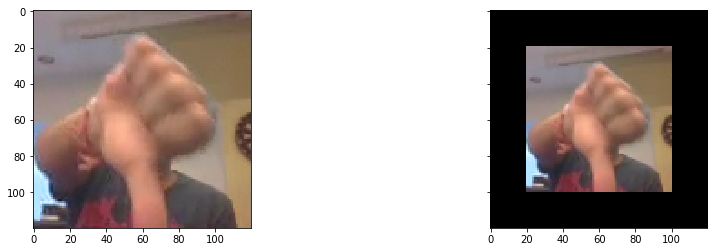

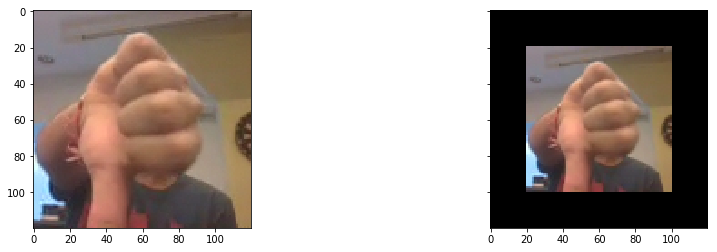

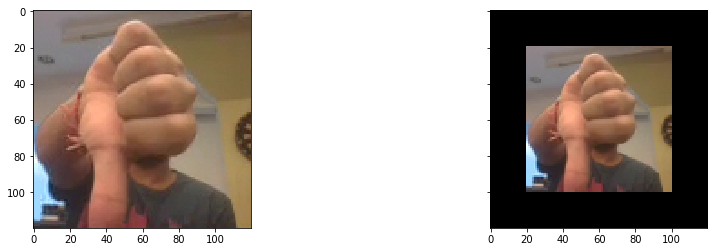

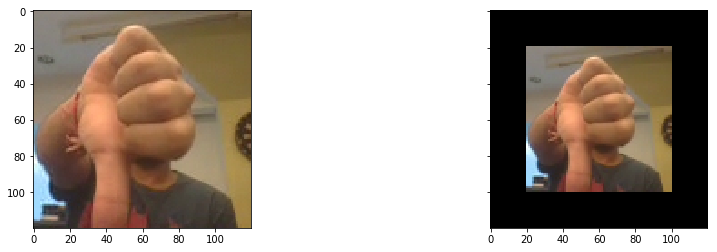

In [13]:
rand_index = random.randint(0, len(train_doc))
size[rand_index].strip().split(';')
imgs = sorted(os.listdir(train_path+'/'+ size[rand_index].split(';')[0]))

for index, item in enumerate(idx):
   
    image = cv2.imread(train_path+'/'+ size[rand_index].strip().split(';')[0]+'/'+imgs[item], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    resized_image = image_reshape(image)
    
    # scaling 
    scale_transforms = tf.AffineTransform(scale=(1.5, 1.5))
    scale_matrix = matrix_to_topleft + scale_transforms + matrix_to_center
    scale_image_zoom_out = tf.warp(resized_image, scale_matrix)


    plot_image([resized_image,scale_image_zoom_out])

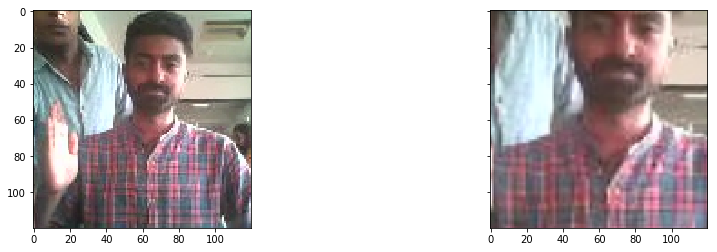

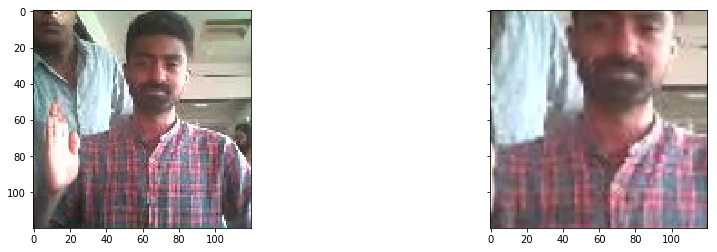

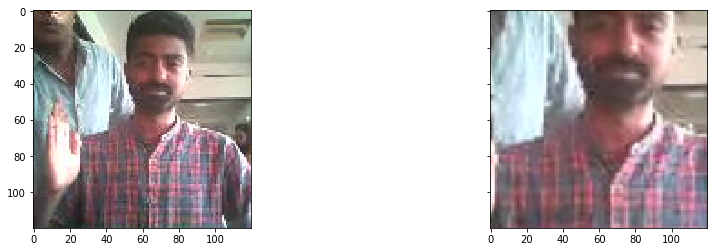

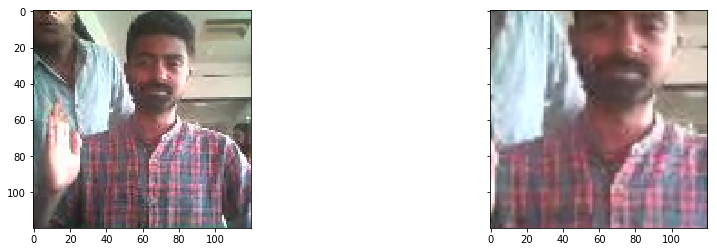

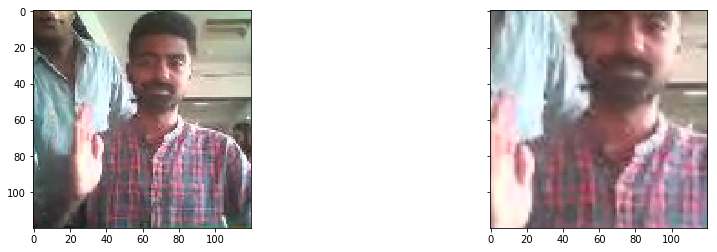

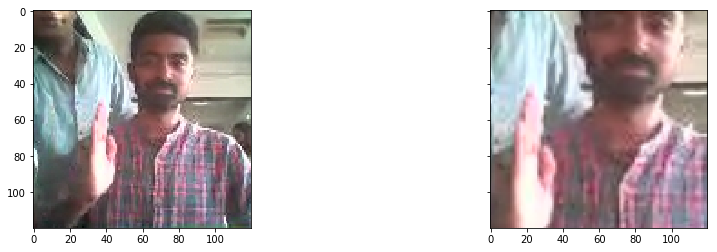

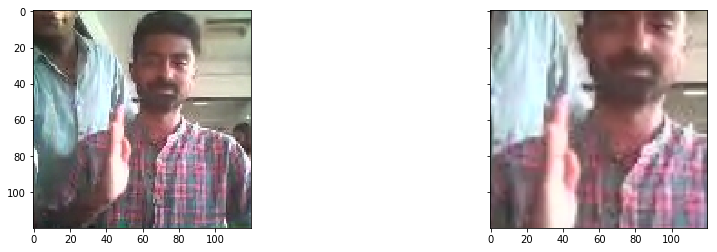

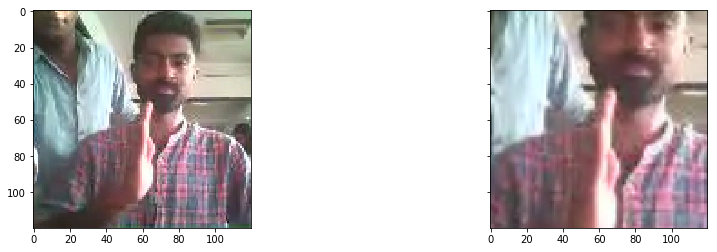

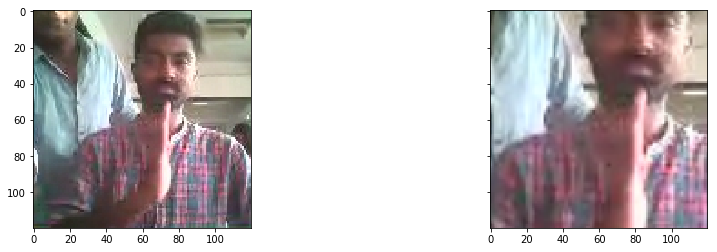

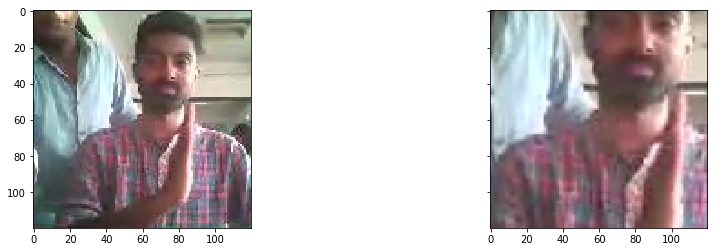

In [14]:
rand_index = random.randint(0, len(train_doc))
size[rand_index].strip().split(';')
imgs = sorted(os.listdir(train_path+'/'+ size[rand_index].split(';')[0]))

for index, item in enumerate(idx):
    
    image = cv2.imread(train_path+'/'+ size[rand_index].strip().split(';')[0]+'/'+imgs[item], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    resized_image = image_reshape(image)
    
    scale_transforms = tf.AffineTransform(scale=(0.6, 0.6))
    scale_matrix = matrix_to_topleft + scale_transforms + matrix_to_center
    scale_image_zoom_in = tf.warp(resized_image, scale_matrix)
    

    plot_image([resized_image,scale_image_zoom_in])

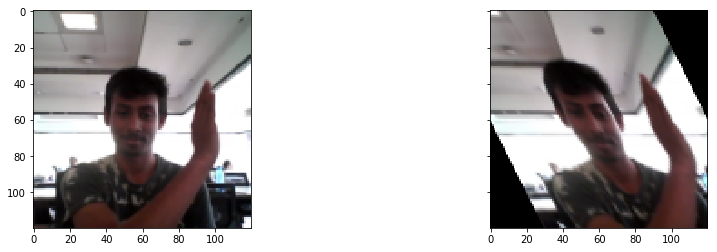

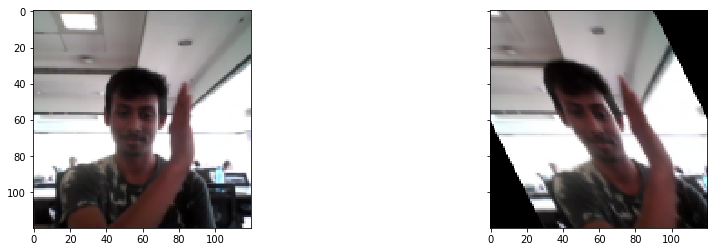

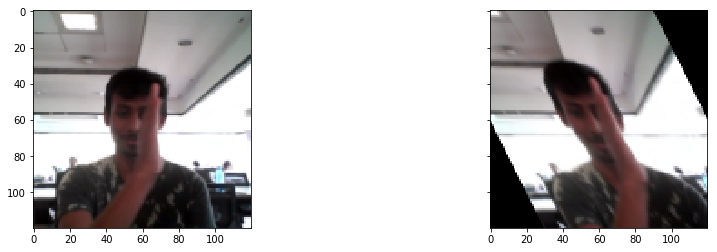

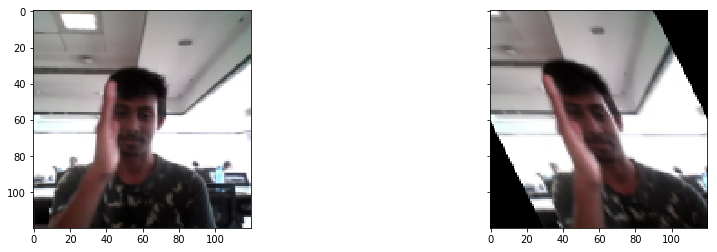

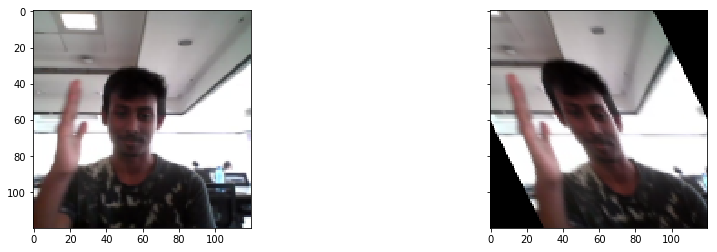

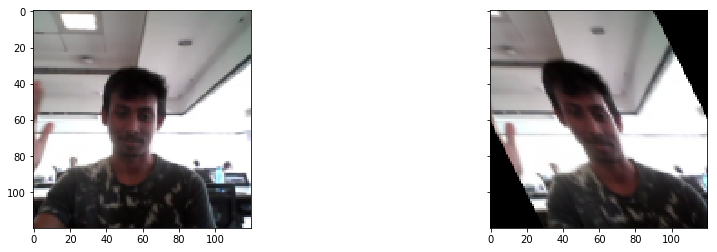

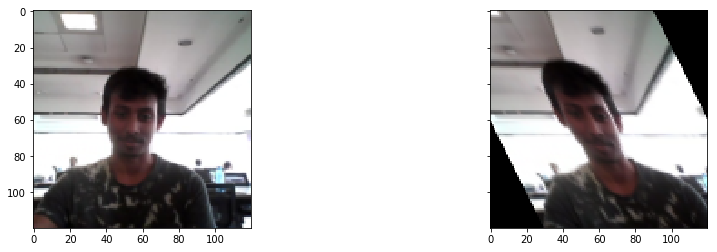

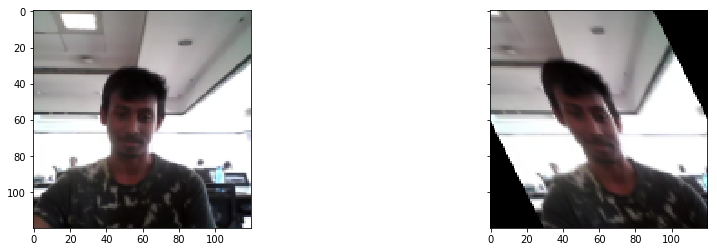

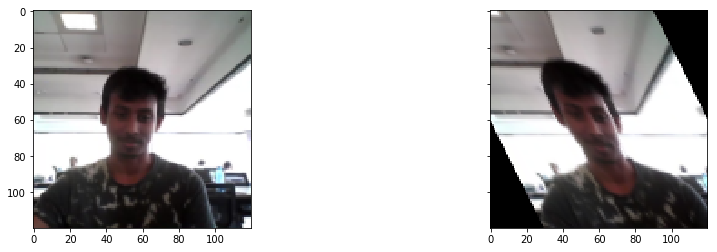

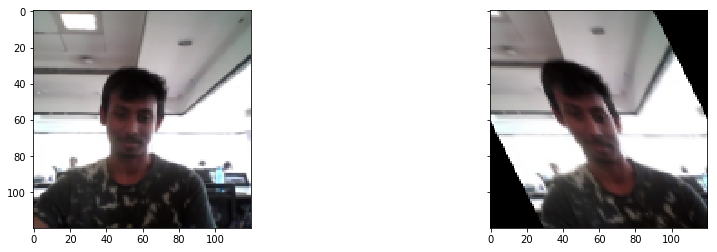

In [15]:
rand_index = random.randint(0, len(train_doc))
size[rand_index].strip().split(';')
imgs = sorted(os.listdir(train_path+'/'+ size[rand_index].split(';')[0]))

for index, item in enumerate(idx):
  
    image = cv2.imread(train_path+'/'+ size[rand_index].strip().split(';')[0]+'/'+imgs[item], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    resized_image = image_reshape(image)
    
    # shear transforms
    shear_transforms = tf.AffineTransform(shear=np.deg2rad(30))
    shear_matrix = matrix_to_topleft + shear_transforms + matrix_to_center
    shear_image = tf.warp(resized_image, shear_matrix)

    plot_image([resized_image,shear_image])

In [16]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=False)

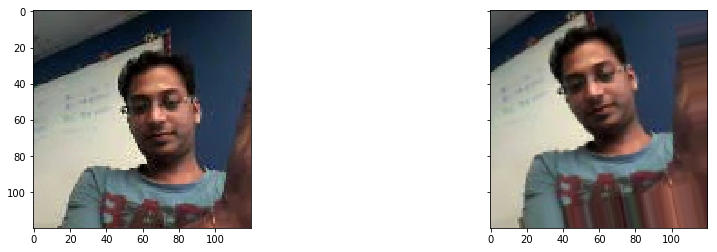

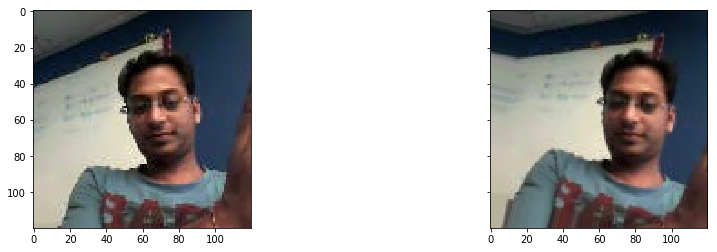

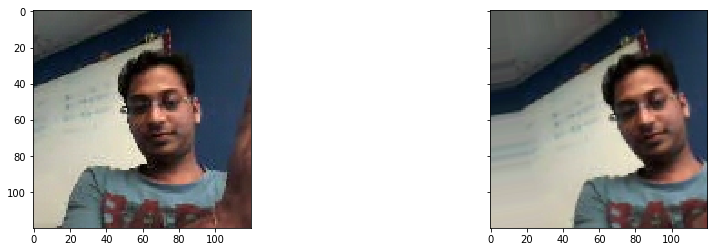

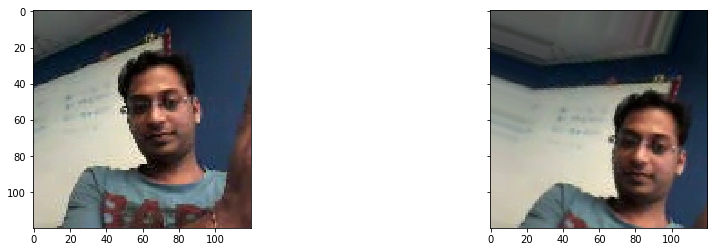

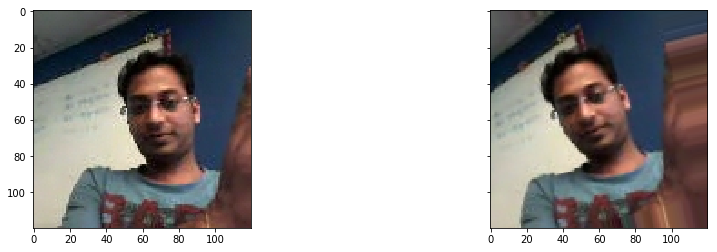

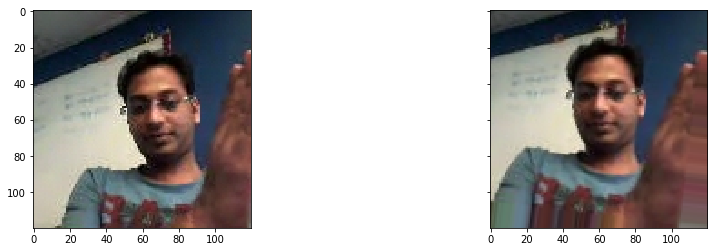

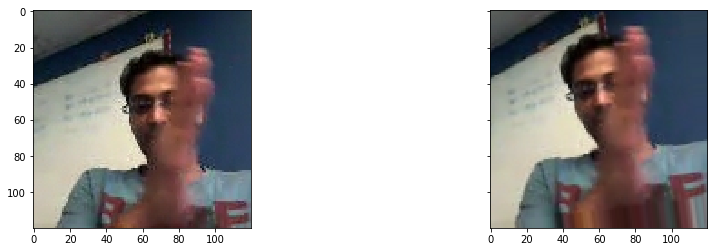

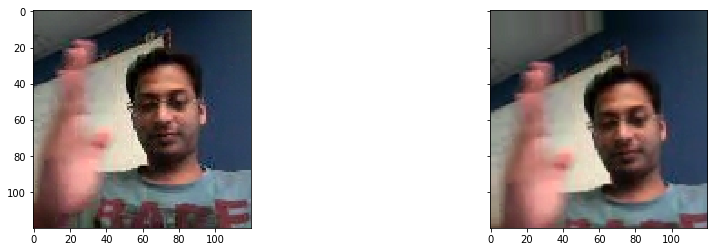

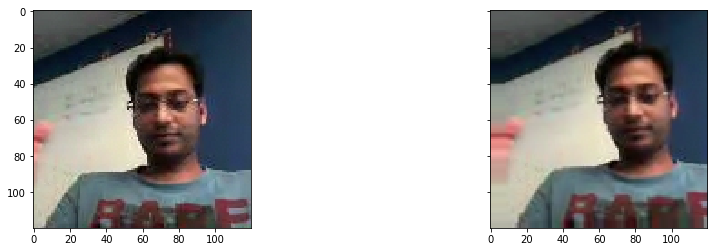

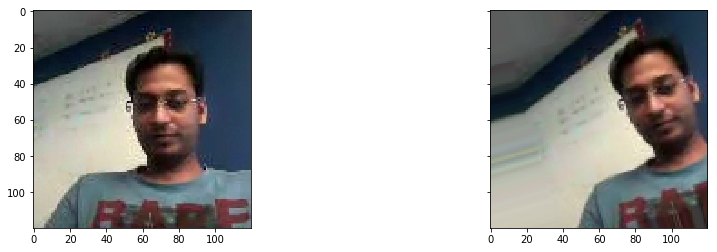

In [17]:
rand_index = random.randint(0, len(train_doc))
size[rand_index].strip().split(';')
imgs = sorted(os.listdir(train_path+'/'+ size[rand_index].split(';')[0]))

for index, item in enumerate(idx):
    
    image = cv2.imread(train_path+'/'+ size[rand_index].strip().split(';')[0]+'/'+imgs[item], cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    resized_image = image_reshape(image)

    aug_x = datagen.random_transform(resized_image)
    plot_image([resized_image, aug_x])

## Generator
This is one of the most important part of the code. The overall structure of the generator has been given. In the generator, you are going to preprocess the images as you have images of 2 different dimensions as well as create a batch of video frames. You have to experiment with `img_idx`, `y`,`z` and normalization such that you get high accuracy.

In [9]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=False)

In [10]:
def generator(source_path=train_path, folder_list=train_doc, batch_size=10, augment=True, validation=False):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    img_idx = np.round(np.linspace(0,total_frames-1,frames_to_pick)).astype(int) # a list of image numbers for a particular video
    while True:
        t = np.random.permutation(folder_list)
        num_batches = len(folder_list)//batch_size # calculate the number of batches 
        
        for batch in range(num_batches): # Iteratation over the number of batches
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels)) # len(img_idx) is the number of images used for each video, (height,width) is the final size of the input images and channels is the number of channels RGB i.e.3
            batch_labels = np.zeros((batch_size,classes)) # batch_labels is the one hot representation of the output
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate iver the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image. Note that the images are of 2 different shape
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_1")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels #you yield the batch_data and the batch_labels
 
        remaining_data = len(folder_list) % batch_size # the code for the remaining data points which are left after full batches
        if (remaining_data > 0):
            batch_size = remaining_data
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
            batch_labels = np.zeros((batch_size,classes))
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_1")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels

Note here that a video is represented above in the generator as (number of images, height, width, number of channels). Take this into consideration while creating the model architecture.

## Model
Here you make the model using different functionalities that Keras provides. Remember to use `Conv3D` and `MaxPooling3D` and not `Conv2D` and `Maxpooling2D` for a 3D convolution model. You would want to use `TimeDistributed` while building a Conv2D + RNN model. Also remember that the last layer is the softmax. Design the network in such a way that the model is able to give good accuracy on the least number of parameters so that it can fit in the memory of the webcam.

In [19]:
# function for plotting model history
def model_visualizer(history):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,4))
    axes[0].plot(history.history['loss'])   
    axes[0].plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    axes[0].legend(['train_loss', 'val_loss'], loc='upper left')

    axes[1].plot(history.history['categorical_accuracy'])   
    axes[1].plot(history.history['val_categorical_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    axes[1].legend(['categorical_accuracy','val_categorical_accuracy'])

In [20]:
# model compiler
def model_compile(model,display_model_summary):
    optimeser = optimizers.Adam()
    loss='categorical_crossentropy'
    scores=['categorical_accuracy']
    optimiser = optimizers.Adam()
    model.compile(optimizer=optimiser, loss=loss, metrics=scores)
    if display_model_summary:
        print (model.summary())
    return model

In [21]:
# save model 
def save_model():
    curr_dt_time = datetime.datetime.now() 
    model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    
    if not os.path.exists(model_name):
        os.mkdir(model_name)
        
    filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'
    print(filepath)
    checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=True, mode='auto', period=1)
    return checkpoint

The steps_per_epoch and validation_steps are used by fit_generator to decide the number of next() calls it need to make.

In [22]:
def find_steps(num_train_sequences,num_val_sequences,batch_size):
    if (num_train_sequences%batch_size) == 0:
        steps_per_epoch = int(num_train_sequences/batch_size)
    else:
        steps_per_epoch = (num_train_sequences//batch_size) + 1

    if (num_val_sequences%batch_size) == 0:
        validation_steps = int(num_val_sequences/batch_size)
    else:
        validation_steps = (num_val_sequences//batch_size) + 1
    return steps_per_epoch,validation_steps

In [23]:
def model_fit(model,train_generator,steps_per_epoch,num_epochs,callbacks_list,val_generator,validation_steps):
    
    model_history = model.fit_generator(train_generator, steps_per_epoch=steps_per_epoch, epochs=num_epochs, verbose=1, 
                    callbacks=callbacks_list, validation_data=val_generator, 
                    validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)
    return model_history

In [24]:
# I am writing this function to save the time required in writing the same code each time we train the model
# this function will take care of data generation, compiling, fitting the model
# added sufficient parameters to control the function execution and made it configurable for greater flexibility
def model_train(train_doc,
                model,
                batch_size,
                num_epochs,
                earlyStopping=True,
                display_model_summary=True,
                augment=False):     
    
    num_train_sequences = len(train_doc)
    print('# training sequences =', num_train_sequences)
    num_val_sequences = len(val_doc)
    print('# validation sequences =', num_val_sequences)
    
    num_epochs = num_epochs # choose the number of epochs
    print ('# epochs =', num_epochs)
    batch_size = batch_size #experiment with the batch size
    print ('# batch size =', batch_size)
    print('# Frames per sequence =', frames_to_pick)
    
    #compile model
    model = model_compile(model,display_model_summary)
    
    # data generator
    train_generator = generator(train_path, train_doc, batch_size, augment=augment)
    val_generator = generator(val_path, val_doc, batch_size,augment=augment,validation=True)
    
    checkpoint = save_model()
    LR = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, cooldown=1, verbose=1, mode='min')# write the REducelronplateau code here
    if earlyStopping:
        ES = EarlyStopping(monitor='val_loss', patience=5, verbose=1, mode='min')
        #callbacks_list = [checkpoint, LR]
        callbacks_list = [checkpoint,LR,ES]
    else:
        callbacks_list = [checkpoint,LR]
        
    steps_per_epoch,validation_steps = find_steps(num_train_sequences,num_val_sequences,batch_size)
    
    model_history = model_fit(model,train_generator,steps_per_epoch,num_epochs,callbacks_list,val_generator,validation_steps)
    model_visualizer(model_history)
    return model_history

### CONV3D Models

In [17]:
# Creating 3d conv architecture, added this in the following function instead of writing similar code each time to create this 3D conv
# the function is configurable via params, saves alot of duplicate effort and promotes clean code
def create_conv3d_model(nb_filters = [8,16,32,64],
                       nb_dense = [256, 128],
                       kernel_size = [(3,3,3),(3,3,3),(3,3,3),(3,3,3)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       dropout_convLayer = True,
                       dropout_denseLayer = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       pooling=True,
                       regularize=False,
                       regularizer=l2(0.01)):
    
    print('# kernel_size = ', kernel_size)
    #Define model
    model = Sequential()
    
    #Convnet layer
    for i,f in enumerate(nb_filters):
        model.add(Conv3D(f, 
                 kernel_size=kernel_size[i], 
                 input_shape=input_shape,
                 padding='same'))
        if batchNormalize_convlayers:
            model.add(BatchNormalization())
        model.add(Activation('relu'))
        if pooling:
             model.add(MaxPooling3D(pool_size=(2,2,2)))
        if dropout_convLayer:
             model.add(Dropout(dropout_convLayer_val))
                
    #Flatten Layers
    model.add(Flatten())
    
    #Dense layer
    for i,f in enumerate(nb_dense):
        if regularize:
            model.add(Dense(f,kernel_regularizer=regularizer))
        else:
            model.add(Dense(f))
        if batchNormalize_denselayers:
            model.add(BatchNormalization())
        model.add(Activation('relu'))
        if dropout_denseLayer:
             model.add(Dropout(dropout_denseLayer_val))
                
    #softmax layer
    model.add(Dense(classes, activation='softmax'))
            
    return model
    

### CNN Model - 1
Model with Batch Normalization at conv layers, dropout only at dense layers.

In [18]:
def conv3d_model():
    model = create_conv3d_model(nb_filters = [8,16,32,64],
                       nb_dense = [256, 128],
                       kernel_size = [(3,3,3),(3,3,3),(3,3,3),(3,3,3)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       dropout_convLayer = False,
                       dropout_denseLayer = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       pooling=True)
    return model

# kernel_size =  [(3, 3, 3), (3, 3, 3), (3, 3, 3), (3, 3, 3)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 10
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d_1 (Conv3D)            (None, 30, 120, 120, 8)   656       
_________________________________________________________________
batch_normalization_1 (Batch (None, 30, 120, 120, 8)   32        
_________________________________________________________________
activation_1 (Activation)    (None, 30, 120, 120, 8)   0         
_________________________________________________________________
max_pooling3d_1 (MaxPooling3 (None, 15, 60, 60, 8)     0         
_________________________________________________________________
conv3d_2 (Conv3D)            (None, 15, 60, 60, 16)    3472      
_________________________________________________________________
batch_normalization_2 (Batch (N

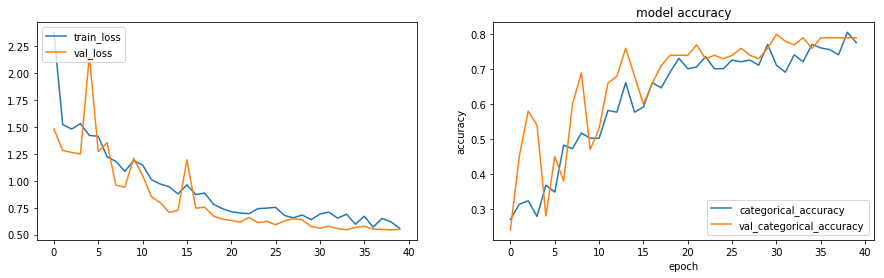

In [28]:
#### compile and train model
model_train(train_doc,
            conv3d_model(),
            batch_size=10, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

### CNN Model 2

In [29]:
def conv3d_model():
    model = create_conv3d_model(nb_filters = [4,8,16,32],
                       nb_dense = [256, 128],
                       kernel_size = [(5,5,5),(3,3,3),(3,3,3),(3,3,3)], # using here slightly different kernel size
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       dropout_convLayer = False,
                       dropout_denseLayer = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       pooling=True)
    return model

# kernel_size =  [(5, 5, 5), (3, 3, 3), (3, 3, 3), (3, 3, 3)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 10
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d_5 (Conv3D)            (None, 30, 120, 120, 4)   1504      
_________________________________________________________________
batch_normalization_5 (Batch (None, 30, 120, 120, 4)   16        
_________________________________________________________________
activation_7 (Activation)    (None, 30, 120, 120, 4)   0         
_________________________________________________________________
max_pooling3d_5 (MaxPooling3 (None, 15, 60, 60, 4)     0         
_________________________________________________________________
conv3d_6 (Conv3D)            (None, 15, 60, 60, 8)     872       
_________________________________________________________________
batch_normalization_6 (Batch (N

67/67 [==============================] - 24s 359ms/step - loss: 1.1056 - categorical_accuracy: 0.5323 - val_loss: 0.8218 - val_categorical_accuracy: 0.6800

Epoch 00016: val_loss improved from 0.91135 to 0.82182, saving model to model_init_2020-09-1914_37_52.779828/model-00016-1.10558-0.53234-0.82182-0.68000.h5
Epoch 17/40
67/67 [==============================] - 22s 331ms/step - loss: 0.9502 - categorical_accuracy: 0.6269 - val_loss: 0.7639 - val_categorical_accuracy: 0.6900

Epoch 00017: val_loss improved from 0.82182 to 0.76388, saving model to model_init_2020-09-1914_37_52.779828/model-00017-0.95016-0.62687-0.76388-0.69000.h5
Epoch 18/40
67/67 [==============================] - 25s 377ms/step - loss: 1.0345 - categorical_accuracy: 0.6020 - val_loss: 0.7777 - val_categorical_accuracy: 0.7100

Epoch 00018: val_loss did not improve from 0.76388
Epoch 19/40
67/67 [==============================] - 25s 367ms/step - loss: 1.0925 - categorical_accuracy: 0.5522 - val_loss: 0.9065 - val_cat

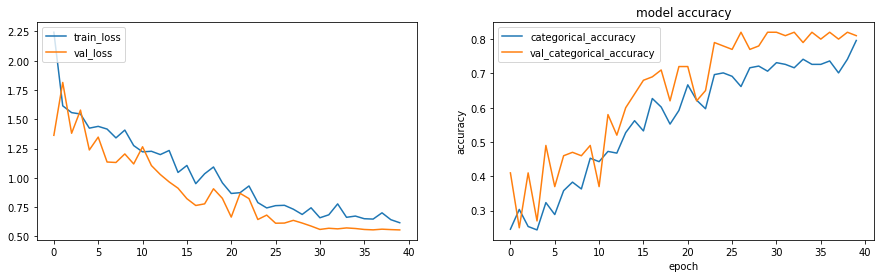

In [30]:
#### compile and train model
model_train(train_doc,
            conv3d_model(),
            batch_size=10, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

### CNN Model 3

In [31]:
def conv3d_model():
    model = create_conv3d_model(nb_filters = [4,8,16,32],
                       nb_dense = [256, 128],
                       kernel_size = [(5,5,5),(5,5,5),(3,3,3),(3,3,3)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       dropout_convLayer = False,
                       dropout_denseLayer = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       pooling=True)
    return model

# kernel_size =  [(5, 5, 5), (5, 5, 5), (3, 3, 3), (3, 3, 3)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 32
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d_9 (Conv3D)            (None, 30, 120, 120, 4)   1504      
_________________________________________________________________
batch_normalization_9 (Batch (None, 30, 120, 120, 4)   16        
_________________________________________________________________
activation_13 (Activation)   (None, 30, 120, 120, 4)   0         
_________________________________________________________________
max_pooling3d_9 (MaxPooling3 (None, 15, 60, 60, 4)     0         
_________________________________________________________________
conv3d_10 (Conv3D)           (None, 15, 60, 60, 8)     4008      
_________________________________________________________________
batch_normalization_10 (Batc (N

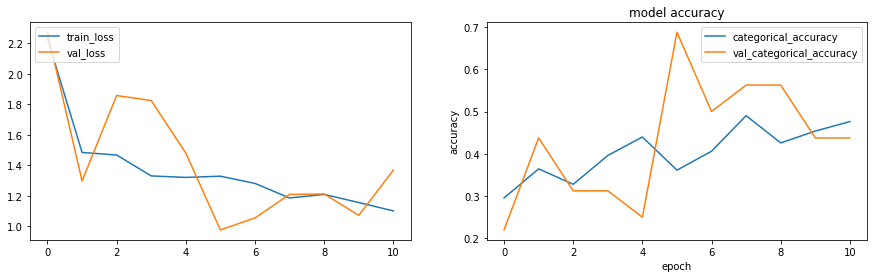

In [32]:
model_train(train_doc,
            conv3d_model(),
            batch_size=32, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

### CNN Model 4

In [33]:
def conv3d_model():
    model = create_conv3d_model(nb_filters = [4,8,16,32],
                       nb_dense = [256, 128],
                       kernel_size = [(5,5,5),(3,3,3),(3,3,3),(1,1,1)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       dropout_convLayer = False,
                       dropout_denseLayer = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       pooling=True)
    return model

# kernel_size =  [(5, 5, 5), (3, 3, 3), (3, 3, 3), (1, 1, 1)]
# training sequences = 663
# validation sequences = 100
# epochs = 100
# batch size = 32
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d_13 (Conv3D)           (None, 30, 120, 120, 4)   1504      
_________________________________________________________________
batch_normalization_13 (Batc (None, 30, 120, 120, 4)   16        
_________________________________________________________________
activation_19 (Activation)   (None, 30, 120, 120, 4)   0         
_________________________________________________________________
max_pooling3d_13 (MaxPooling (None, 15, 60, 60, 4)     0         
_________________________________________________________________
conv3d_14 (Conv3D)           (None, 15, 60, 60, 8)     872       
_________________________________________________________________
batch_normalization_14 (Batc (

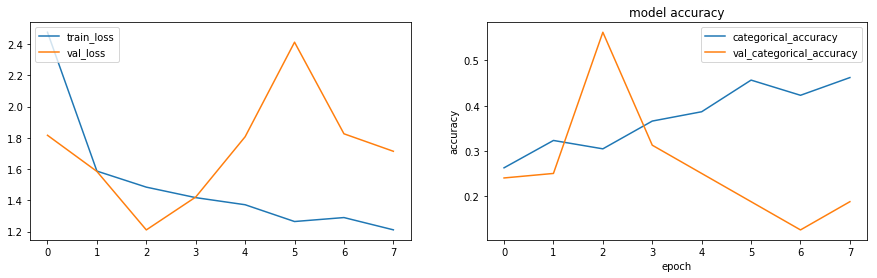

In [34]:
model_train(train_doc,
            conv3d_model(),
            batch_size=32, 
            num_epochs=100,
            earlyStopping=True,
            display_model_summary=True)

### CNN Model 5

In [35]:
def create_conv3d_model2(nb_filters = [8,16,32,64],
                       nb_dense = [256, 128],
                       kernel_size = [(3,3,3),(3,3,3),(3,3,3),(3,3,3)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       dropout_convLayer = True,
                       dropout_denseLayer = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       pooling=True,
                       regularize=False,
                       regularizer=l2(0.01)):
    
    print('# kernel_size = ', kernel_size)
    #Define model
    model = Sequential()
    
    #Convnet layer
    for i,f in enumerate(nb_filters):
        model.add(Conv3D(f, kernel_size=kernel_size[i], input_shape=input_shape, padding='same'))
        try:
            model.add(Conv3D(f, kernel_size=kernel_size[i+1], input_shape=input_shape, padding='same'))
        except:
            pass
        if batchNormalize_convlayers:
            model.add(BatchNormalization())
        model.add(Activation('relu'))
        if pooling:
             model.add(MaxPooling3D(pool_size=(2,2,2)))
        if dropout_convLayer:
             model.add(Dropout(dropout_convLayer_val))
                
    #Flatten Layers
    model.add(Flatten())
    
    #Dense layer
    for i,f in enumerate(nb_dense):
        if regularize:
            model.add(Dense(f,kernel_regularizer=regularizer))
        else:
            model.add(Dense(f))
        if batchNormalize_denselayers:
            model.add(BatchNormalization())
        model.add(Activation('relu'))
        if dropout_denseLayer:
             model.add(Dropout(dropout_denseLayer_val))
                
    #softmax layer
    model.add(Dense(classes, activation='softmax'))
            
    return model

In [36]:
def conv3d_model():
    model = create_conv3d_model2(nb_filters = [4,8,16,32],
                       nb_dense = [256, 128],
                       kernel_size = [(3,3,3),(3,3,3),(3,3,3),(1,1,1)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       dropout_convLayer = False,
                       dropout_denseLayer = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       pooling=True)
    return model

# kernel_size =  [(3, 3, 3), (3, 3, 3), (3, 3, 3), (1, 1, 1)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 32
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d_17 (Conv3D)           (None, 30, 120, 120, 4)   328       
_________________________________________________________________
conv3d_18 (Conv3D)           (None, 30, 120, 120, 4)   436       
_________________________________________________________________
batch_normalization_17 (Batc (None, 30, 120, 120, 4)   16        
_________________________________________________________________
activation_25 (Activation)   (None, 30, 120, 120, 4)   0         
_________________________________________________________________
max_pooling3d_17 (MaxPooling (None, 15, 60, 60, 4)     0         
_________________________________________________________________
conv3d_19 (Conv3D)           (N

21/21 [==============================] - 34s 2s/step - loss: 0.9976 - categorical_accuracy: 0.5882 - val_loss: 0.8813 - val_categorical_accuracy: 0.8125

Epoch 00015: val_loss improved from 0.99604 to 0.88133, saving model to model_init_2020-09-1915_36_52.640001/model-00015-0.99762-0.58824-0.88133-0.81250.h5
Epoch 16/40
21/21 [==============================] - 33s 2s/step - loss: 1.0563 - categorical_accuracy: 0.5602 - val_loss: 0.9538 - val_categorical_accuracy: 0.5625

Epoch 00016: val_loss did not improve from 0.88133
Epoch 17/40
21/21 [==============================] - 33s 2s/step - loss: 0.9564 - categorical_accuracy: 0.5854 - val_loss: 0.9262 - val_categorical_accuracy: 0.6875

Epoch 00017: val_loss did not improve from 0.88133

Epoch 00017: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 18/40
21/21 [==============================] - 32s 2s/step - loss: 0.9885 - categorical_accuracy: 0.5854 - val_loss: 1.3589 - val_categorical_accuracy: 0.5000

Epoch 000

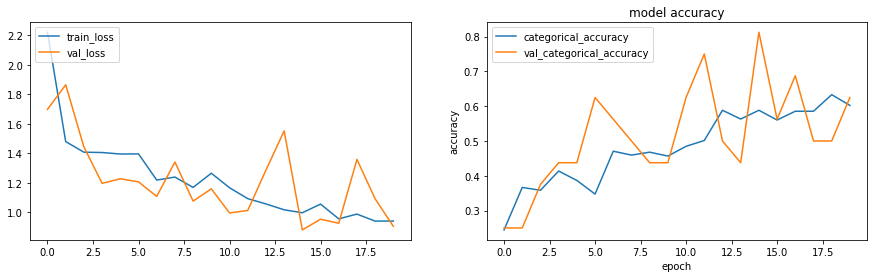

In [37]:
model_train(train_doc,
            conv3d_model(),
            batch_size=32, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

### CNN Model 6

In [38]:
model = Sequential()
model.add(Conv3D(16, kernel_size=(5,5,5), activation='relu', input_shape=(frames_to_pick,height,width,channels),data_format='channels_last'))
model.add(BatchNormalization())
model.add(Conv3D(8, (5,5,5), padding='same',activation='relu'))
model.add(Conv3D(8, (3,3,3), padding='same',activation='relu'))
model.add(Conv3D(4, (3,3,3), padding='same',activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))
model.add(MaxPooling3D(pool_size=(1,2,2), strides=(1,2,2)))

model.add(Conv3D(8, (5,5,5), padding='same',activation='relu'))
model.add(Conv3D(8, (3,3,3), padding='same',activation='relu'))
model.add(Conv3D(4, (3,3,3), padding='same',activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))
model.add(MaxPooling3D(pool_size=(1,2,2), strides=(1,2,2)))

model.add(Conv3D(8, (5,5,5), padding='same',activation='relu'))
model.add(Conv3D(8, (3,3,3), padding='same',activation='relu'))
model.add(Conv3D(4, (3,3,3), padding='same',activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))
model.add(MaxPooling3D(pool_size=(1,2,2), strides=(1,2,2)))

model.add(MaxPooling3D(pool_size=(1, 2, 2), strides=(1, 2, 2)))
model.add(BatchNormalization())
model.add(Dropout(0.25))
model.add(MaxPooling3D(pool_size=(1, 2, 2), strides=(1, 2, 2)))
model.add(BatchNormalization())
model.add(Flatten())
model.add(Dense(256,activation='relu'))
model.add(BatchNormalization())
model.add(Dense(128,activation='relu'))
model.add(BatchNormalization())

model.add(Dense(classes, activation='softmax'))
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d_24 (Conv3D)           (None, 26, 116, 116, 16)  6016      
_________________________________________________________________
batch_normalization_21 (Batc (None, 26, 116, 116, 16)  64        
_________________________________________________________________
conv3d_25 (Conv3D)           (None, 26, 116, 116, 8)   16008     
_________________________________________________________________
conv3d_26 (Conv3D)           (None, 26, 116, 116, 8)   1736      
_________________________________________________________________
conv3d_27 (Conv3D)           (None, 26, 116, 116, 4)   868       
_________________________________________________________________
batch_normalization_22 (Batc (None, 26, 116, 116, 4)   16        
_________________________________________________________________
dropout_11 (Dropout)         (None, 26, 116, 116, 4)   0         
__________

# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 4
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d_24 (Conv3D)           (None, 26, 116, 116, 16)  6016      
_________________________________________________________________
batch_normalization_21 (Batc (None, 26, 116, 116, 16)  64        
_________________________________________________________________
conv3d_25 (Conv3D)           (None, 26, 116, 116, 8)   16008     
_________________________________________________________________
conv3d_26 (Conv3D)           (None, 26, 116, 116, 8)   1736      
_________________________________________________________________
conv3d_27 (Conv3D)           (None, 26, 116, 116, 4)   868       
_________________________________________________________________
batch_normalization_22 (Batc (None, 26, 116, 116, 4)   16        
____________________________


Epoch 00012: val_loss did not improve from 1.56857

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 13/40
166/166 [==============================] - 188s 1s/step - loss: 1.5522 - categorical_accuracy: 0.3153 - val_loss: 1.5844 - val_categorical_accuracy: 0.2300

Epoch 00013: val_loss did not improve from 1.56857
Epoch 00013: early stopping


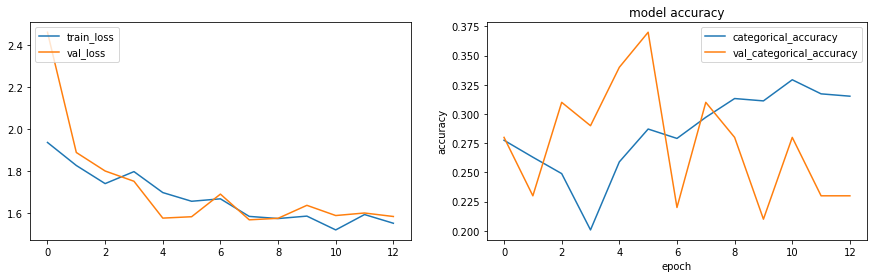

In [39]:
model_train(train_doc,
            model,
            batch_size=4, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

Among all the above six CNN models, 1st and 2nd CNN models are having almost comparable results with lowest loss and highest accuracy. Next on 1st CNN, type-2 and type-3 normalisation can be tried.

### CNN Model 7

In [20]:
# Will run the generator code again with type-2 normalisation
def generator(source_path=train_path, folder_list=train_doc, batch_size=10, augment=True, validation=False):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    img_idx = np.round(np.linspace(0,total_frames-1,frames_to_pick)).astype(int) # a list of image numbers for a particular video
    while True:
        t = np.random.permutation(folder_list)
        num_batches = len(folder_list)//batch_size # calculate the number of batches 
        
        for batch in range(num_batches): # Iteratation over the number of batches
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels)) # len(img_idx) is the number of images used for each video, (height,width) is the final size of the input images and channels is the number of channels RGB i.e.3
            batch_labels = np.zeros((batch_size,classes)) # batch_labels is the one hot representation of the output
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate iver the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image. Note that the images are of 2 different shape
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_2")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels #you yield the batch_data and the batch_labels
 
        remaining_data = len(folder_list) % batch_size # the code for the remaining data points which are left after full batches
        if (remaining_data > 0):
            batch_size = remaining_data
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
            batch_labels = np.zeros((batch_size,classes))
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_2")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels

In [21]:
# running again CNN Model 1 with normalisation type_2
def conv3d_model():
    model = create_conv3d_model(nb_filters = [8,16,32,64],
                       nb_dense = [256, 128],
                       kernel_size = [(3,3,3),(3,3,3),(3,3,3),(3,3,3)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       dropout_convLayer = False,
                       dropout_denseLayer = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       pooling=True)
    return model

# kernel_size =  [(3, 3, 3), (3, 3, 3), (3, 3, 3), (3, 3, 3)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 10
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d_1 (Conv3D)            (None, 30, 120, 120, 8)   656       
_________________________________________________________________
batch_normalization_1 (Batch (None, 30, 120, 120, 8)   32        
_________________________________________________________________
activation_1 (Activation)    (None, 30, 120, 120, 8)   0         
_________________________________________________________________
max_pooling3d_1 (MaxPooling3 (None, 15, 60, 60, 8)     0         
_________________________________________________________________
conv3d_2 (Conv3D)            (None, 15, 60, 60, 16)    3472      
_________________________________________________________________
batch_normalization_2 (Batch (N

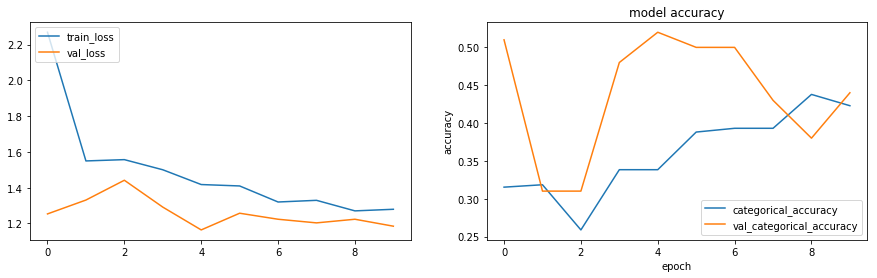

In [22]:
#### compile and train model
model_train(train_doc,
            conv3d_model(),
            batch_size=10, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

### CNN Model 8

In [23]:
# Will run the generator code again with type-3 normalisation
def generator(source_path=train_path, folder_list=train_doc, batch_size=10, augment=True, validation=False):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    img_idx = np.round(np.linspace(0,total_frames-1,frames_to_pick)).astype(int) # a list of image numbers for a particular video
    while True:
        t = np.random.permutation(folder_list)
        num_batches = len(folder_list)//batch_size # calculate the number of batches 
        
        for batch in range(num_batches): # Iteratation over the number of batches
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels)) # len(img_idx) is the number of images used for each video, (height,width) is the final size of the input images and channels is the number of channels RGB i.e.3
            batch_labels = np.zeros((batch_size,classes)) # batch_labels is the one hot representation of the output
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate iver the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image. Note that the images are of 2 different shape
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_3")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels #you yield the batch_data and the batch_labels
 
        remaining_data = len(folder_list) % batch_size # the code for the remaining data points which are left after full batches
        if (remaining_data > 0):
            batch_size = remaining_data
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
            batch_labels = np.zeros((batch_size,classes))
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_3")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels

In [24]:
# running again CNN Model 1 with normalisation type_3
def conv3d_model():
    model = create_conv3d_model(nb_filters = [8,16,32,64],
                       nb_dense = [256, 128],
                       kernel_size = [(3,3,3),(3,3,3),(3,3,3),(3,3,3)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       dropout_convLayer = False,
                       dropout_denseLayer = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       pooling=True)
    return model

# kernel_size =  [(3, 3, 3), (3, 3, 3), (3, 3, 3), (3, 3, 3)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 10
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d_5 (Conv3D)            (None, 30, 120, 120, 8)   656       
_________________________________________________________________
batch_normalization_5 (Batch (None, 30, 120, 120, 8)   32        
_________________________________________________________________
activation_7 (Activation)    (None, 30, 120, 120, 8)   0         
_________________________________________________________________
max_pooling3d_5 (MaxPooling3 (None, 15, 60, 60, 8)     0         
_________________________________________________________________
conv3d_6 (Conv3D)            (None, 15, 60, 60, 16)    3472      
_________________________________________________________________
batch_normalization_6 (Batch (N


Epoch 00015: val_loss did not improve from 0.96296
Epoch 16/40
67/67 [==============================] - 38s 571ms/step - loss: 1.0476 - categorical_accuracy: 0.5224 - val_loss: 0.8596 - val_categorical_accuracy: 0.6800

Epoch 00016: val_loss improved from 0.96296 to 0.85956, saving model to model_init_2020-09-2011_31_23.639924/model-00016-1.04758-0.52239-0.85956-0.68000.h5
Epoch 17/40
67/67 [==============================] - 38s 574ms/step - loss: 1.0041 - categorical_accuracy: 0.5473 - val_loss: 0.8592 - val_categorical_accuracy: 0.6600

Epoch 00017: val_loss improved from 0.85956 to 0.85919, saving model to model_init_2020-09-2011_31_23.639924/model-00017-1.00408-0.54726-0.85919-0.66000.h5
Epoch 18/40
67/67 [==============================] - 38s 562ms/step - loss: 0.9713 - categorical_accuracy: 0.5473 - val_loss: 0.8936 - val_categorical_accuracy: 0.6200

Epoch 00018: val_loss did not improve from 0.85919
Epoch 19/40
67/67 [==============================] - 38s 569ms/step - loss: 0.

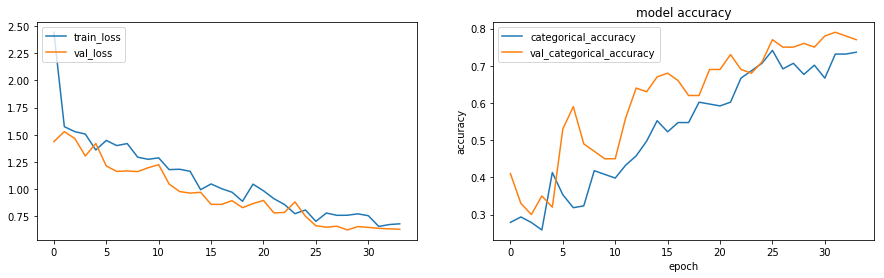

In [25]:
#### compile and train model
model_train(train_doc,
            conv3d_model(),
            batch_size=10, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

#### Comparing accuracies of CNN models 1,2, 7 & 8, training and validation accuracy for model 2 is highest and model 2 results are the best among all eight CNN models results.

### CNN-RNN Stack Models

In [16]:
def create_cnnrnn_model(nb_lstm=None,
                       nb_gru=None,
                       nb_dense=None,
                       nb_filters = [8,16,32,64],
                       kernel_size = [(3,3),(3,3),(3,3),(3,3)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       batchNormalize_lstmgrulayers = False,
                       dropout_convLayer = False,
                       dropout_denseLayer = True,
                       dropout_lstmgrulayers = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       dropout_lstmgruLayer_val = 0.5,
                       pooling=True,
                       regularize=False,
                       regularizer=l2(0.01)):
    
    print('# input shape = ', input_shape)
    print('# conv layers = ', nb_filters)

    print('# dense layers = ', nb_dense)
    print('# kernel size = ', kernel_size)

    #Define model
    model = Sequential()
    
    #Convnet layer
    for i,f in enumerate(nb_filters):
        model.add(TimeDistributed(Conv2D(f,
                                         kernel_size=kernel_size[i], 
                                         padding='same'), 
                                         input_shape=input_shape))
        if batchNormalize_convlayers:
            model.add(BatchNormalization())
        model.add(Activation('relu'))
        if pooling:
             model.add(TimeDistributed(MaxPooling2D((2, 2))))
        if dropout_convLayer:
             model.add(Dropout(dropout_convLayer_val))
                
    #Flatten Layers
    model.add(TimeDistributed(Flatten()))
    
    #Lstm layer
    if nb_lstm is not None :
        for i,f in enumerate(nb_lstm):
            model.add(LSTM(f,return_sequences=False))
        if batchNormalize_lstmgrulayers:
            model.add(BatchNormalization())
        if dropout_lstmgrulayers:
             model.add(Dropout(dropout_lstmgruLayer_val))
                
    #Gru layer
    if nb_gru is not None:
        for i,f in enumerate(nb_gru):
            model.add(GRU(f,return_sequences=False))
        if batchNormalize_lstmgrulayers:
            model.add(BatchNormalization())
        if dropout_lstmgrulayers:
             model.add(Dropout(dropout_lstmgruLayer_val))
                
    #Dense Layer
    if nb_dense is not None:
        for i,f in enumerate(nb_dense):
            if regularize:
                model.add(Dense(f,kernel_regularizer=regularizer))
            else:
                model.add(Dense(f))
        if batchNormalize_denselayers:
            model.add(BatchNormalization())
        model.add(Activation('relu'))
        if dropout_denseLayer:
             model.add(Dropout(dropout_denseLayer_val))
                   
    #softmax layer
    model.add(Dense(classes, activation='softmax'))
            
    return model

### LSTM Model 1

In [41]:
def conv_lstm_model():
    model = create_cnnrnn_model(nb_lstm=[64],
                       nb_dense=[64],
                       nb_filters = [8,16,32,64],
                       kernel_size = [(2,2),(2,2),(2,2),(2,2)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       batchNormalize_lstmgrulayers = False,
                       dropout_convLayer = False,
                       dropout_denseLayer = True,
                       dropout_lstmgrulayers = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       dropout_lstmgruLayer_val = 0.5,
                       pooling=True)
    return model

# input shape =  (30, 120, 120, 3)
# conv layers =  [8, 16, 32, 64]
# dense layers =  [64]
# kernel size =  [(2, 2), (2, 2), (2, 2), (2, 2)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 24
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_1 (TimeDist (None, 30, 120, 120, 8)   104       
_________________________________________________________________
batch_normalization_29 (Batc (None, 30, 120, 120, 8)   32        
_________________________________________________________________
activation_31 (Activation)   (None, 30, 120, 120, 8)   0         
_________________________________________________________________
time_distributed_2 (TimeDist (None, 30, 60, 60, 8)     0         
_________________________________________________________________
time_distributed_3 (TimeDist (None, 30, 60, 60, 16)    528       
__________________

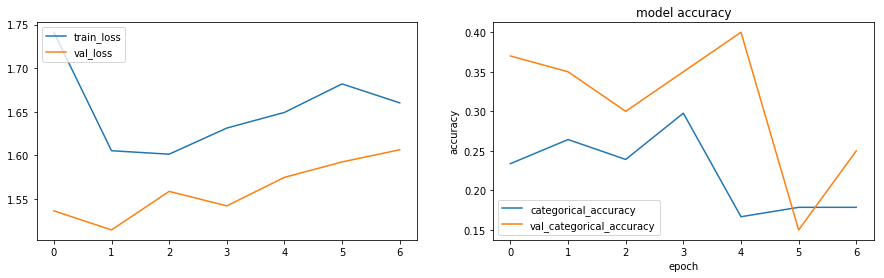

In [42]:
#### compile and train model
model_train(train_doc,
            conv_lstm_model(),
            batch_size=24, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

### LSTM Model 2

In [12]:
# Considering batch normalisation for lstmgrulayers and dropouts for convlayer.
def conv_lstm_model():
    model = create_cnnrnn_model(nb_lstm=[64],
                       nb_dense=[64],
                       nb_filters = [8,16,32,64],
                       kernel_size = [(2,2),(2,2),(2,2),(2,2)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       batchNormalize_lstmgrulayers = True, 
                       dropout_convLayer = True,
                       dropout_denseLayer = True,
                       dropout_lstmgrulayers = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       dropout_lstmgruLayer_val = 0.5,
                       pooling=True)
    return model

# input shape =  (30, 120, 120, 3)
# conv layers =  [8, 16, 32, 64]
# dense layers =  [64]
# kernel size =  [(2, 2), (2, 2), (2, 2), (2, 2)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 24
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_10 (TimeDis (None, 30, 120, 120, 8)   104       
_________________________________________________________________
batch_normalization_14 (Batc (None, 30, 120, 120, 8)   32        
_________________________________________________________________
activation_18 (Activation)   (None, 30, 120, 120, 8)   0         
_________________________________________________________________
time_distributed_11 (TimeDis (None, 30, 60, 60, 8)     0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 30, 60, 60, 8)     0         
__________________

28/28 [==============================] - 15s 532ms/step - loss: 1.5890 - categorical_accuracy: 0.2262 - val_loss: 1.6284 - val_categorical_accuracy: 0.1000

Epoch 00014: val_loss did not improve from 1.52656

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 15/40
28/28 [==============================] - 15s 546ms/step - loss: 1.5852 - categorical_accuracy: 0.2738 - val_loss: 1.6271 - val_categorical_accuracy: 0.1500

Epoch 00015: val_loss did not improve from 1.52656
Epoch 16/40
28/28 [==============================] - 15s 537ms/step - loss: 1.5672 - categorical_accuracy: 0.3452 - val_loss: 1.5692 - val_categorical_accuracy: 0.3000

Epoch 00016: val_loss did not improve from 1.52656

Epoch 00016: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
Epoch 17/40
28/28 [==============================] - 16s 564ms/step - loss: 1.5602 - categorical_accuracy: 0.2500 - val_loss: 1.6097 - val_categorical_accuracy: 0.2500

Epoch 00017: val_loss 

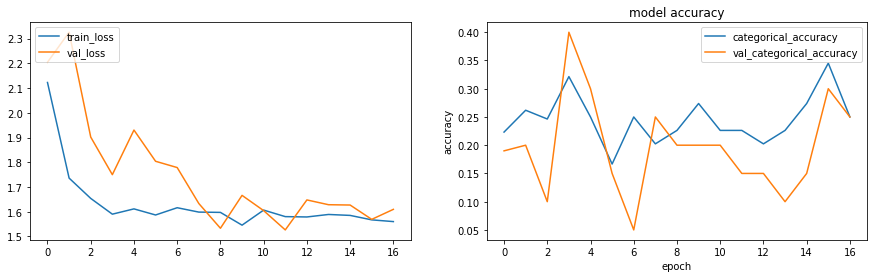

In [30]:
#### compile and train model
model_train(train_doc,
            conv_lstm_model(),
            batch_size=24, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

Here results for LSTM model 2 are better than the same for LSTM model 1. 

### LSTM Model 3

In [25]:
# Will run the generator code again with type-2 normalisation for LSTM
def generator(source_path=train_path, folder_list=train_doc, batch_size=10, augment=True, validation=False):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    img_idx = np.round(np.linspace(0,total_frames-1,frames_to_pick)).astype(int) # a list of image numbers for a particular video
    while True:
        t = np.random.permutation(folder_list)
        num_batches = len(folder_list)//batch_size # calculate the number of batches 
        
        for batch in range(num_batches): # Iteratation over the number of batches
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels)) # len(img_idx) is the number of images used for each video, (height,width) is the final size of the input images and channels is the number of channels RGB i.e.3
            batch_labels = np.zeros((batch_size,classes)) # batch_labels is the one hot representation of the output
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate iver the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image. Note that the images are of 2 different shape
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_2")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels #you yield the batch_data and the batch_labels
 
        remaining_data = len(folder_list) % batch_size # the code for the remaining data points which are left after full batches
        if (remaining_data > 0):
            batch_size = remaining_data
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
            batch_labels = np.zeros((batch_size,classes))
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_2")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels

In [26]:
# Considering batch normalisation for lstmgrulayers and dropouts for convlayer.
def conv_lstm_model():
    model = create_cnnrnn_model(nb_lstm=[64],
                       nb_dense=[64],
                       nb_filters = [8,16,32,64],
                       kernel_size = [(2,2),(2,2),(2,2),(2,2)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       batchNormalize_lstmgrulayers = True, 
                       dropout_convLayer = True,
                       dropout_denseLayer = True,
                       dropout_lstmgrulayers = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       dropout_lstmgruLayer_val = 0.5,
                       pooling=True)
    return model

# input shape =  (30, 120, 120, 3)
# conv layers =  [8, 16, 32, 64]
# dense layers =  [64]
# kernel size =  [(2, 2), (2, 2), (2, 2), (2, 2)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 24
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_10 (TimeDis (None, 30, 120, 120, 8)   104       
_________________________________________________________________
batch_normalization_6 (Batch (None, 30, 120, 120, 8)   32        
_________________________________________________________________
activation_6 (Activation)    (None, 30, 120, 120, 8)   0         
_________________________________________________________________
time_distributed_11 (TimeDis (None, 30, 60, 60, 8)     0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 30, 60, 60, 8)     0         
__________________

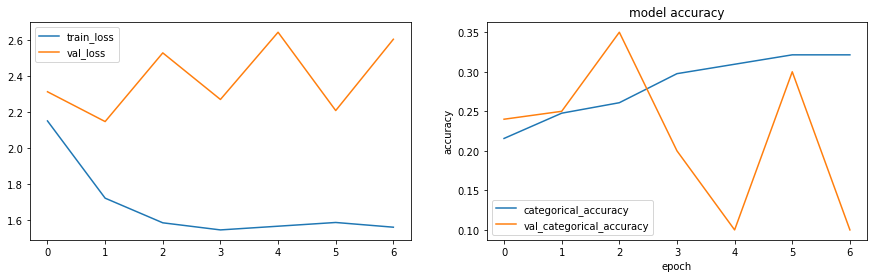

In [27]:
#### compile and train model
model_train(train_doc,
            conv_lstm_model(),
            batch_size=24, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

### LSTM Model 4

In [30]:
# Will run the generator code again with type-3 normalisation for LSTM
def generator(source_path=train_path, folder_list=train_doc, batch_size=10, augment=True, validation=False):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    img_idx = np.round(np.linspace(0,total_frames-1,frames_to_pick)).astype(int) # a list of image numbers for a particular video
    while True:
        t = np.random.permutation(folder_list)
        num_batches = len(folder_list)//batch_size # calculate the number of batches 
        
        for batch in range(num_batches): # Iteratation over the number of batches
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels)) # len(img_idx) is the number of images used for each video, (height,width) is the final size of the input images and channels is the number of channels RGB i.e.3
            batch_labels = np.zeros((batch_size,classes)) # batch_labels is the one hot representation of the output
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate iver the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image. Note that the images are of 2 different shape
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_3")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels #you yield the batch_data and the batch_labels
 
        remaining_data = len(folder_list) % batch_size # the code for the remaining data points which are left after full batches
        if (remaining_data > 0):
            batch_size = remaining_data
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
            batch_labels = np.zeros((batch_size,classes))
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_3")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels

In [31]:
# Considering batch normalisation for lstmgrulayers and dropouts for convlayer.
def conv_lstm_model():
    model = create_cnnrnn_model(nb_lstm=[64],
                       nb_dense=[64],
                       nb_filters = [8,16,32,64],
                       kernel_size = [(2,2),(2,2),(2,2),(2,2)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       batchNormalize_lstmgrulayers = True, 
                       dropout_convLayer = True,
                       dropout_denseLayer = True,
                       dropout_lstmgrulayers = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       dropout_lstmgruLayer_val = 0.5,
                       pooling=True)
    return model

# input shape =  (30, 120, 120, 3)
# conv layers =  [8, 16, 32, 64]
# dense layers =  [64]
# kernel size =  [(2, 2), (2, 2), (2, 2), (2, 2)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 24
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_19 (TimeDis (None, 30, 120, 120, 8)   104       
_________________________________________________________________
batch_normalization_11 (Batc (None, 30, 120, 120, 8)   32        
_________________________________________________________________
activation_11 (Activation)   (None, 30, 120, 120, 8)   0         
_________________________________________________________________
time_distributed_20 (TimeDis (None, 30, 60, 60, 8)     0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 30, 60, 60, 8)     0         
__________________

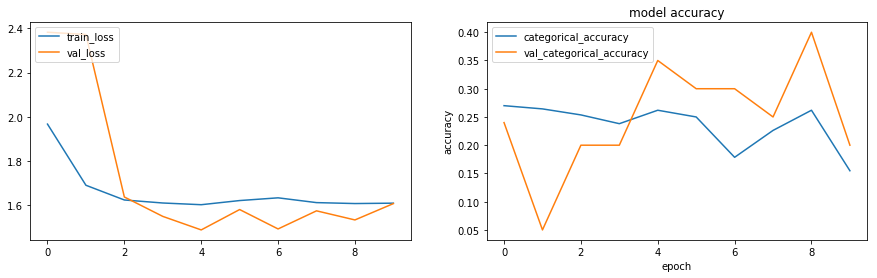

In [32]:
#### compile and train model
model_train(train_doc,
            conv_lstm_model(),
            batch_size=24, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

### GRU Model 1

In [43]:
def conv_gru_model():
    model = create_cnnrnn_model(nb_gru=[256],
                       nb_dense=[256],
                       nb_filters = [8,16,32,64],
                       kernel_size = [(3,3),(3,3),(3,3),(3,3)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       batchNormalize_lstmgrulayers = False,
                       dropout_convLayer = False,
                       dropout_denseLayer = True,
                       dropout_lstmgrulayers = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       dropout_lstmgruLayer_val = 0.5,
                       pooling=True)
    return model

# input shape =  (30, 120, 120, 3)
# conv layers =  [8, 16, 32, 64]
# dense layers =  [256]
# kernel size =  [(3, 3), (3, 3), (3, 3), (3, 3)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 16
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_10 (TimeDis (None, 30, 120, 120, 8)   224       
_________________________________________________________________
batch_normalization_33 (Batc (None, 30, 120, 120, 8)   32        
_________________________________________________________________
activation_36 (Activation)   (None, 30, 120, 120, 8)   0         
_________________________________________________________________
time_distributed_11 (TimeDis (None, 30, 60, 60, 8)     0         
_________________________________________________________________
time_distributed_12 (TimeDis (None, 30, 60, 60, 16)    1168      
_________________

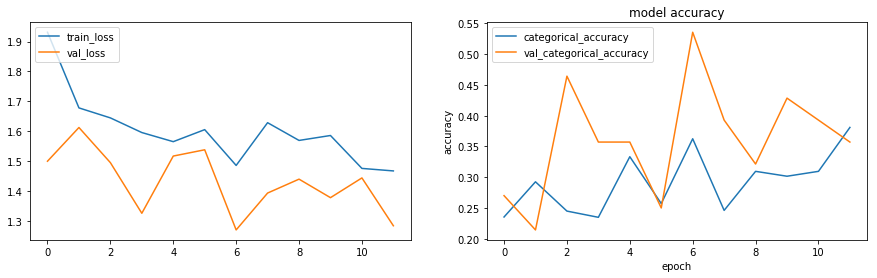

In [44]:
#### compile and train model
model_train(train_doc,
            conv_gru_model(),
            batch_size=16, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

### GRU Model 2

In [31]:
# Considering batch normalisation for lstmgrulayers and dropouts for convlayer.
def conv_gru_model():
    model = create_cnnrnn_model(nb_gru=[256],
                       nb_dense=[256],
                       nb_filters = [8,16,32,64],
                       kernel_size = [(3,3),(3,3),(3,3),(3,3)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       batchNormalize_lstmgrulayers = True,
                       dropout_convLayer = True,
                       dropout_denseLayer = True,
                       dropout_lstmgrulayers = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       dropout_lstmgruLayer_val = 0.5,
                       pooling=True)
    return model

# input shape =  (30, 120, 120, 3)
# conv layers =  [8, 16, 32, 64]
# dense layers =  [256]
# kernel size =  [(3, 3), (3, 3), (3, 3), (3, 3)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 16
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_19 (TimeDis (None, 30, 120, 120, 8)   224       
_________________________________________________________________
batch_normalization_19 (Batc (None, 30, 120, 120, 8)   32        
_________________________________________________________________
activation_23 (Activation)   (None, 30, 120, 120, 8)   0         
_________________________________________________________________
time_distributed_20 (TimeDis (None, 30, 60, 60, 8)     0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 30, 60, 60, 8)     0         
_________________

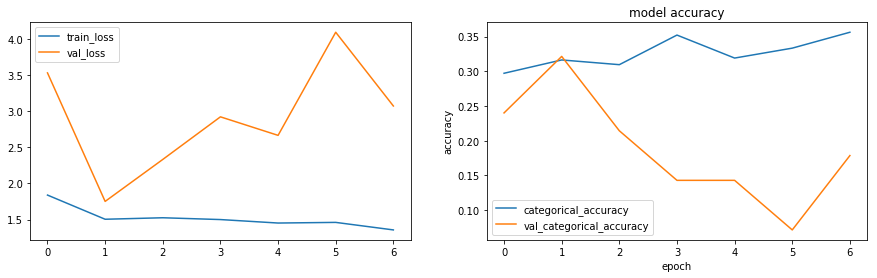

In [32]:
#### compile and train model
model_train(train_doc,
            conv_gru_model(),
            batch_size=16, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

Results from GRU model 1 is better than the same from GRU model 2, although the accuracy of the GRU model 1 is also on the lower side.

### GRU Model 3

In [33]:
# Will run the generator code again with type-2 normalisation for LSTM
def generator(source_path=train_path, folder_list=train_doc, batch_size=10, augment=True, validation=False):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    img_idx = np.round(np.linspace(0,total_frames-1,frames_to_pick)).astype(int) # a list of image numbers for a particular video
    while True:
        t = np.random.permutation(folder_list)
        num_batches = len(folder_list)//batch_size # calculate the number of batches 
        
        for batch in range(num_batches): # Iteratation over the number of batches
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels)) # len(img_idx) is the number of images used for each video, (height,width) is the final size of the input images and channels is the number of channels RGB i.e.3
            batch_labels = np.zeros((batch_size,classes)) # batch_labels is the one hot representation of the output
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate iver the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image. Note that the images are of 2 different shape
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_2")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels #you yield the batch_data and the batch_labels
 
        remaining_data = len(folder_list) % batch_size # the code for the remaining data points which are left after full batches
        if (remaining_data > 0):
            batch_size = remaining_data
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
            batch_labels = np.zeros((batch_size,classes))
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_2")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels

In [34]:
# Considering batch normalisation for lstmgrulayers and dropouts for convlayer.
def conv_gru_model():
    model = create_cnnrnn_model(nb_gru=[256],
                       nb_dense=[256],
                       nb_filters = [8,16,32,64],
                       kernel_size = [(3,3),(3,3),(3,3),(3,3)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       batchNormalize_lstmgrulayers = True,
                       dropout_convLayer = True,
                       dropout_denseLayer = True,
                       dropout_lstmgrulayers = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       dropout_lstmgruLayer_val = 0.5,
                       pooling=True)
    return model

# input shape =  (30, 120, 120, 3)
# conv layers =  [8, 16, 32, 64]
# dense layers =  [256]
# kernel size =  [(3, 3), (3, 3), (3, 3), (3, 3)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 16
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_28 (TimeDis (None, 30, 120, 120, 8)   224       
_________________________________________________________________
batch_normalization_16 (Batc (None, 30, 120, 120, 8)   32        
_________________________________________________________________
activation_16 (Activation)   (None, 30, 120, 120, 8)   0         
_________________________________________________________________
time_distributed_29 (TimeDis (None, 30, 60, 60, 8)     0         
_________________________________________________________________
dropout_19 (Dropout)         (None, 30, 60, 60, 8)     0         
_________________

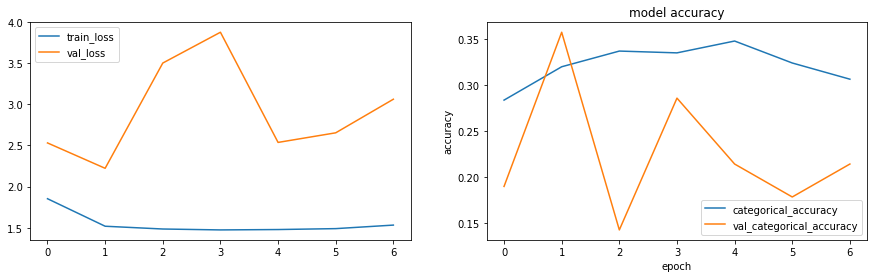

In [35]:
#### compile and train model
model_train(train_doc,
            conv_gru_model(),
            batch_size=16, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

### GRU Model 4

In [36]:
# Will run the generator code again with type-3 normalisation for LSTM
def generator(source_path=train_path, folder_list=train_doc, batch_size=10, augment=True, validation=False):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    img_idx = np.round(np.linspace(0,total_frames-1,frames_to_pick)).astype(int) # a list of image numbers for a particular video
    while True:
        t = np.random.permutation(folder_list)
        num_batches = len(folder_list)//batch_size # calculate the number of batches 
        
        for batch in range(num_batches): # Iteratation over the number of batches
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels)) # len(img_idx) is the number of images used for each video, (height,width) is the final size of the input images and channels is the number of channels RGB i.e.3
            batch_labels = np.zeros((batch_size,classes)) # batch_labels is the one hot representation of the output
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate iver the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image. Note that the images are of 2 different shape
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_3")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels #you yield the batch_data and the batch_labels
 
        remaining_data = len(folder_list) % batch_size # the code for the remaining data points which are left after full batches
        if (remaining_data > 0):
            batch_size = remaining_data
            batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
            batch_labels = np.zeros((batch_size,classes))
            
            if not validation and augment:
                augmented_batch_data = np.zeros((batch_size,len(img_idx),height,width,channels))
                augmented_batch_labels = np.zeros((batch_size,classes))
                
            for folder in range(batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #Crop and resize the image
                    resized_image = image_reshape(image)
                    
                    #Normalize the image
                    batch_data = normalize(batch_data,resized_image,folder,idx, norm_type="norm_3")
                    
                    if not validation and augment:
                        augmented_batch_data[folder,idx] =  datagen.random_transform(resized_image)                        
                        
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                
                if not validation and augment:
                    batch_data = np.concatenate([batch_data, augmented_batch_data])
                    augmented_batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
                    batch_labels = np.concatenate([batch_labels, augmented_batch_labels])
            
            yield batch_data, batch_labels

In [37]:
# Considering batch normalisation for lstmgrulayers and dropouts for convlayer.
def conv_gru_model():
    model = create_cnnrnn_model(nb_gru=[256],
                       nb_dense=[256],
                       nb_filters = [8,16,32,64],
                       kernel_size = [(3,3),(3,3),(3,3),(3,3)],
                       input_shape=(frames_to_pick,height,width,channels),
                       batchNormalize_convlayers = True,
                       batchNormalize_denselayers = False,
                       batchNormalize_lstmgrulayers = True,
                       dropout_convLayer = True,
                       dropout_denseLayer = True,
                       dropout_lstmgrulayers = True,
                       dropout_convLayer_val=0.25,
                       dropout_denseLayer_val=0.5,
                       dropout_lstmgruLayer_val = 0.5,
                       pooling=True)
    return model

# input shape =  (30, 120, 120, 3)
# conv layers =  [8, 16, 32, 64]
# dense layers =  [256]
# kernel size =  [(3, 3), (3, 3), (3, 3), (3, 3)]
# training sequences = 663
# validation sequences = 100
# epochs = 40
# batch size = 16
# Frames per sequence = 30
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_37 (TimeDis (None, 30, 120, 120, 8)   224       
_________________________________________________________________
batch_normalization_21 (Batc (None, 30, 120, 120, 8)   32        
_________________________________________________________________
activation_21 (Activation)   (None, 30, 120, 120, 8)   0         
_________________________________________________________________
time_distributed_38 (TimeDis (None, 30, 60, 60, 8)     0         
_________________________________________________________________
dropout_25 (Dropout)         (None, 30, 60, 60, 8)     0         
_________________

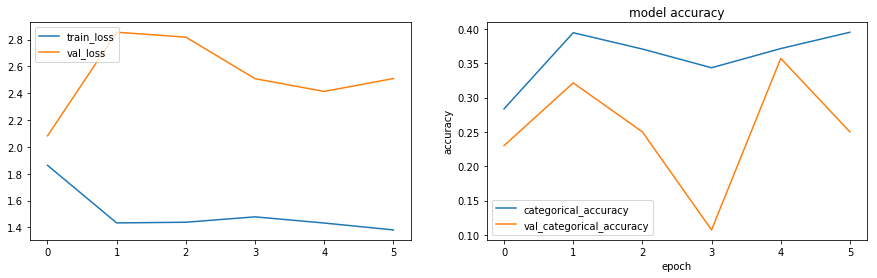

In [38]:
#### compile and train model
model_train(train_doc,
            conv_gru_model(),
            batch_size=16, 
            num_epochs=40,
            earlyStopping=True,
            display_model_summary=True)

### 3D CNN results are better than the same from the stack of 2D CNN + RNN

#### End of the case study